<a href="https://colab.research.google.com/github/Midorima6666/DeepLearning/blob/main/DZ4(Deeplearning).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Практическая работа №4. Построение сверточной нейронной сети для классификации изображений, с использованием BatchNormalization() и Dropout()

[Код с пары](https://colab.research.google.com/drive/1cvPrPI09ySQy-D92gKTzmanVi2cj5Gw_?usp=sharing)

## Задание 1. Построение сверточной нейронной сети для классификации изображений из датасета CIFAR-100, с использованием BatchNormalization() и Dropout():

### 1.1. Загрузите исходный датасет. Разделите его на обучающую и тестовую выборки:

*P.S.: Не забудьте обратить внимание на размерность (shape) исходных данных и при необходимости измените её (см. примеры из предыдущих занятий)*

[Информация о датасете в Kaggle](https://www.kaggle.com/datasets/fedesoriano/cifar100?resource=download&select=meta)

[Техническая документация по использованию датасета в Keras](https://keras.io/api/datasets/cifar100/)





In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import warnings
from pylab import rcParams
import keras
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.optimizers import Adam

In [ ]:
import keras
from keras.datasets import cifar100

(X_train, y_train), (X_test, y_test) = keras.datasets.cifar100.load_data(label_mode="coarse")
assert X_train.shape == (50000, 32, 32, 3)
assert X_test.shape == (10000, 32, 32, 3)
assert y_train.shape == (50000, 1)
assert y_test.shape == (10000, 1)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((50000, 32, 32, 3), (10000, 32, 32, 3), (50000, 1), (10000, 1))

In [ ]:
# ! pip install wldhx.yadisk-direct
# ! curl -L $(yadisk-direct https://disk.yandex.ru/d/8B8umhNUevJ6ng) -o cifar100.zip
# ! unzip -qq cifar100.zip

In [ ]:
# import numpy as np

# def unpickle(file):
#     import pickle
#     with open(file, 'rb') as fo:
#         dict = pickle.load(fo, encoding='bytes')
#     return dict

# metadata_path = '/content/meta'
# metadata = unpickle(metadata_path)
# superclass_dict = dict(list(enumerate(metadata[b'coarse_label_names'])))

# data_pre_path = '/content/' # change this path
# # File paths
# data_train_path = data_pre_path + 'train'
# data_test_path = data_pre_path + 'test'
# # Read dictionary
# data_train_dict = unpickle(data_train_path)
# data_test_dict = unpickle(data_test_path)
# # Get data (change the coarse_labels if you want to use the 100 classes)
# X_train = data_train_dict[b'data']
# y_train = np.array(data_train_dict[b'coarse_labels'])
# X_test = data_test_dict[b'data']
# y_test = np.array(data_test_dict[b'coarse_labels'])

### 1.2. Визуализируйте несколько изображений из датасета:


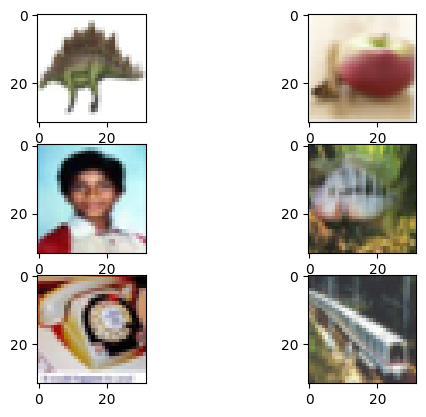

In [ ]:
import matplotlib.pyplot as plt

for i in range(1, 7):
    plt.subplot(3, 2, i)
    plt.imshow(X_train[i])

plt.show()

### 1.3. Произведите нормализацию данных:

In [ ]:
X_train = X_train / 255.0
X_test = X_test / 255.0

y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((50000, 32, 32, 3), (10000, 32, 32, 3), (50000, 20), (10000, 20))

In [ ]:
# X_train = X_train.reshape((X_train.shape[0],
#                            X_train.shape[1],
#                            X_train.shape[2], 3))
# X_train = X_train/ 255.0

# X_test = X_test.reshape((X_test.shape[0],
#                          X_test.shape[1],
#                          X_test.shape[2], 3))
# X_test = X_test/ 255.0

# y_train = y_train.reshape(y_train.shape[0])
# y_test = y_test.reshape(y_test.shape[0])

### 1.4. Создайте модель сверточной нейронной сети для решения поставленной задачи без использования BatchNormalization() и Dropout():

Имя данной модели: model_1

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Dense, Flatten
from keras.optimizers import Adam, SGD

model_1 = Sequential([
    Conv2D(32, (3,3), padding='same', activation='leaky_relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same', activation='leaky_relu'),
    MaxPooling2D((2, 2), strides=2),
    # Conv2D(64, (3,3), padding='same', activation='leaky_relu'),
    # MaxPooling2D((2, 2), strides=2),
    Flatten(),
    Dense(128, activation='leaky_relu'),
    Dense(20, activation='softmax')
])

model_1.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_71 (Conv2D)                   │ (None, 32, 32, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_52 (MaxPooling2D)      │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_72 (Conv2D)                   │ (None, 16, 16, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_53 (MaxPooling2D)      │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_28 (Flatten)                 │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_56 (Dense)                     │ (None, 128)                 │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_57 (Dense)                     │ (None, 20)                  │           2,580 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 546,388 (2.08 MB)

 Trainable params: 546,388 (2.08 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# параметры + компиляция
EPOCHS = 50

model_1.compile(optimizer='adam',
             loss='categorical_crossentropy',
             metrics=['accuracy'])

In [ ]:
# добавляем коллбэки
from keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

checkpoint = ModelCheckpoint(filepath="best_model_4_1.keras",
                             monitor="val_loss",
                             save_best_only=True,
                             verbose=0) # Сохранение модели
                                         # только при улучшении
                                         # валидационной точности

Обучите созданную модель

In [ ]:
model_1_history = model_1.fit(X_train, y_train,
                              validation_data=(X_test, y_test),
                              epochs=EPOCHS,
                              batch_size=256,
                              verbose=1,
                              callbacks=[early_stopping, checkpoint])

Epoch 1/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.2072 - loss: 2.5873 - val_accuracy: 0.3311 - val_loss: 2.1601
Epoch 2/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.3676 - loss: 2.0399 - val_accuracy: 0.4221 - val_loss: 1.8944
Epoch 3/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.4435 - loss: 1.8151 - val_accuracy: 0.4477 - val_loss: 1.7958
Epoch 4/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.4896 - loss: 1.6600 - val_accuracy: 0.4685 - val_loss: 1.7221
Epoch 5/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.5233 - loss: 1.5431 - val_accuracy: 0.4900 - val_loss: 1.6507
Epoch 6/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.5553 - loss: 1.4363 - val_accuracy: 0.5080 - val_loss: 1.5990
Epoch 7/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.5838 - loss: 1.3444 - val_accuracy: 0.5048 - val_loss: 1.6095
Epoch 8/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.6083 - loss: 1.2549 - val_accuracy: 

In [ ]:
from keras.models import load_model

model_1 = load_model("/content/best_model_4_1.keras")

### 1.5. Создайте модель сверточной нейронной сети для решения поставленной задачи с использованием BatchNormalization():

Имя данной модели: model_2

In [ ]:
model_2 = Sequential([
    Conv2D(32, (3,3), padding='same', activation='leaky_relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same', activation='leaky_relu'),
    MaxPooling2D((2, 2), strides=2),
    # Conv2D(64, (3,3), padding='same', activation='leaky_relu'),
    # MaxPooling2D((2, 2), strides=2),
    Flatten(),
    Dense(128),
    BatchNormalization(),
    Activation("leaky_relu"),
    Dense(20),
    BatchNormalization(),
    Activation("softmax")
])

model_2.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

checkpoint = ModelCheckpoint(filepath="best_model_4_2.keras",
                             monitor="val_loss",
                             save_best_only=True,
                             verbose=0)

In [ ]:
# первая модель (сохранена)

model_2 = Sequential([
    Conv2D(32, (3,3), padding='same', activation='relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same', activation='relu'),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(128, (3,3), padding='same', activation='relu'),
    Flatten(),
    Dense(128),
    BatchNormalization(),
    Activation("relu"),
    Dense(20),
    BatchNormalization(),
    Activation("softmax")
])

# model_2.summary()

model_2.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

checkpoint = ModelCheckpoint(filepath="best_model_4_2.keras",
                             monitor="val_loss",
                             save_best_only=True,
                             verbose=0)

Обучите созданную модель

In [ ]:
model_2_history = model_2.fit(X_train, y_train,
                              validation_data=(X_test, y_test),
                              batch_size=256,
                              epochs=EPOCHS,
                              verbose=1,
                              callbacks=[early_stopping, checkpoint])

Epoch 1/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.2801 - loss: 2.4100 - val_accuracy: 0.2832 - val_loss: 2.5515
Epoch 2/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.4910 - loss: 1.7643 - val_accuracy: 0.4258 - val_loss: 2.0031
Epoch 3/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.5667 - loss: 1.5118 - val_accuracy: 0.4404 - val_loss: 1.9072
Epoch 4/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6299 - loss: 1.3078 - val_accuracy: 0.4629 - val_loss: 1.8037
Epoch 5/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.6750 - loss: 1.1523 - val_accuracy: 0.4360 - val_loss: 1.8976
Epoch 6/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.7302 - loss: 0.9950 - val_accuracy: 0.4752 - val_loss: 1.7884
Epoch 7/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.7739 - loss: 0.8564 - val_accuracy: 0.5007 - val_loss: 1.7051
Epoch 8/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.8192 - loss: 0.7205 - val_accuracy: 

In [ ]:
from keras.models import load_model

model_2 = load_model("/content/best_model_4_2.keras")

### 1.6. Создайте модель сверточной нейронной сети для решения поставленной задачи с использованием Dropout():

Имя данной модели: model_3

In [ ]:
model_3 = Sequential([
    Conv2D(32, (3,3), padding='same', activation='leaky_relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same', activation='leaky_relu'),
    MaxPooling2D((2, 2), strides=2),
    Dropout(0.5),
    Flatten(),
    Dense(128),
    # BatchNormalization(),
    Activation("leaky_relu"),
    Dense(20),
    # BatchNormalization(),
    Activation("softmax")
])

model_3.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

checkpoint = ModelCheckpoint(filepath="best_model_4_3.keras",
                             monitor="val_loss",
                             save_best_only=True,
                             verbose=0)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# первая модель (сохранена)

model_3 = Sequential([
    Conv2D(16, (3,3), activation='relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), activation='relu'),
    Dropout(0.5),
    Flatten(),
    Dense(64),
    Activation("relu"),
    # Dropout(0.5),
    Dense(20),
    Activation("softmax")
])

# model_3.summary()

model_3.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

checkpoint = ModelCheckpoint(filepath="best_model_4_3.keras",
                             monitor="val_accuracy",
                             save_best_only=True,
                             verbose=0)

Обучите созданную модель

In [ ]:
model_3_history = model_3.fit(X_train, y_train,
                              validation_data=(X_test, y_test),
                              batch_size=256,
                              epochs=EPOCHS,
                              verbose=1,
                              callbacks=[checkpoint])

Epoch 1/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.1920 - loss: 2.6295 - val_accuracy: 0.3339 - val_loss: 2.1805
Epoch 2/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.3611 - loss: 2.0915 - val_accuracy: 0.3989 - val_loss: 1.9471
Epoch 3/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.4159 - loss: 1.8959 - val_accuracy: 0.4384 - val_loss: 1.8354
Epoch 4/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.4487 - loss: 1.7877 - val_accuracy: 0.4613 - val_loss: 1.7566
Epoch 5/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.4779 - loss: 1.6960 - val_accuracy: 0.4887 - val_loss: 1.6746
Epoch 6/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.5002 - loss: 1.6186 - val_accuracy: 0.4818 - val_loss: 1.6795
Epoch 7/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.5126 - loss: 1.5675 - val_accuracy: 0.5069 - val_loss: 1.6099
Epoch 8/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.5324 - loss: 1.5022 - val_accuracy

In [ ]:
from keras.models import load_model

model_3 = load_model("/content/best_model_4_3.keras")

### 1.7. Создайте модель сверточной нейронной сети для решения поставленной задачи с использованием Dropout() и BatchNormalization().

См. рекомендации [здесь](https://stackoverflow.com/questions/39691902/ordering-of-batch-normalization-and-dropout) и [здесь](https://www.kaggle.com/code/ryanholbrook/dropout-and-batch-normalization/)

Имя данной модели: model_4

In [ ]:
# model_4 = Sequential([
#     Conv2D(32, (3,3), padding='same', activation='leaky_relu', input_shape=(32, 32, 3)),
#     MaxPooling2D((2, 2), strides=2),
#     Conv2D(64, (3,3), padding='same', activation='leaky_relu'),
#     MaxPooling2D((2, 2), strides=2),
#     Dropout(0.5),
#     Flatten(),
#     Dense(128),
#     BatchNormalization(),
#     Activation("leaky_relu"),
#     Dense(20),
#     BatchNormalization(),
#     Activation("softmax")
# ])
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, Activation, LeakyReLU, Input
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Создаём входной слой
inputs = Input(shape=(32, 32, 3))

# Добавляем остальные слои
x = Conv2D(32, (3,3), padding='same')(inputs)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D((2, 2), strides=2)(x)
x = Conv2D(64, (3,3), padding='same')(x)
x = LeakyReLU(alpha=0.1)(x)
x = MaxPooling2D((2, 2), strides=2)(x)
x = Dropout(0.5)(x)
x = Flatten()(x)
x = Dense(128)(x)
x = BatchNormalization()(x)
x = LeakyReLU(alpha=0.1)(x)
x = Dense(20)(x)
x = BatchNormalization()(x)
outputs = Activation("softmax")(x)

# Определяем модель
model_4 = Model(inputs=inputs, outputs=outputs)

model_4.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

checkpoint = ModelCheckpoint(filepath="best_model_4_4.keras",
                             monitor="val_loss",
                             save_best_only=True,
                             verbose=0)

In [ ]:
# первая модель (сохранена)

model_4 = Sequential([
    Conv2D(32, (3,3), padding='same', activation='relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(64, (3,3), padding='same', activation='relu'),
    MaxPooling2D((2, 2), strides=2),
    Conv2D(128, (3,3), padding='same', activation='relu'),
    Dropout(0.5),
    Flatten(),
    Dense(128),
    BatchNormalization(),
    Activation("relu"),
    Dense(20),
    BatchNormalization(),
    Activation("softmax")
])

# model_3.summary()

model_4.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

checkpoint = ModelCheckpoint(filepath="best_model_4_4.keras",
                             monitor="val_accuracy",
                             save_best_only=True,
                             verbose=0)

Обучите созданную модель

In [ ]:
model_4_history = model_4.fit(X_train, y_train,
                              validation_data=(X_test, y_test),
                              batch_size=256,
                              epochs=50,
                              verbose=1,
                              callbacks=[early_stopping, checkpoint])

Epoch 1/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.2126 - loss: 2.6232 - val_accuracy: 0.3223 - val_loss: 2.5275
Epoch 2/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.3956 - loss: 2.0310 - val_accuracy: 0.4316 - val_loss: 2.0404
Epoch 3/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.4602 - loss: 1.8143 - val_accuracy: 0.4438 - val_loss: 1.8549
Epoch 4/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.4932 - loss: 1.6840 - val_accuracy: 0.4763 - val_loss: 1.7350
Epoch 5/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.5260 - loss: 1.5763 - val_accuracy: 0.5217 - val_loss: 1.5963
Epoch 6/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.5559 - loss: 1.4803 - val_accuracy: 0.5237 - val_loss: 1.5732
Epoch 7/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.5700 - loss: 1.4157 - val_accuracy: 0.5044 - val_loss: 1.6240
Epoch 8/50
196/196 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.5849 - loss: 1.3497 - val_accuracy: 

In [ ]:
from keras.models import load_model

model_4 = load_model("/content/best_model_4_4.keras")

### Задание 1.8. Пойстройте график обучения для каждой модели. Сделайте выводы по каждому из них. Подведите итог и выделите наиболее удачную модель:

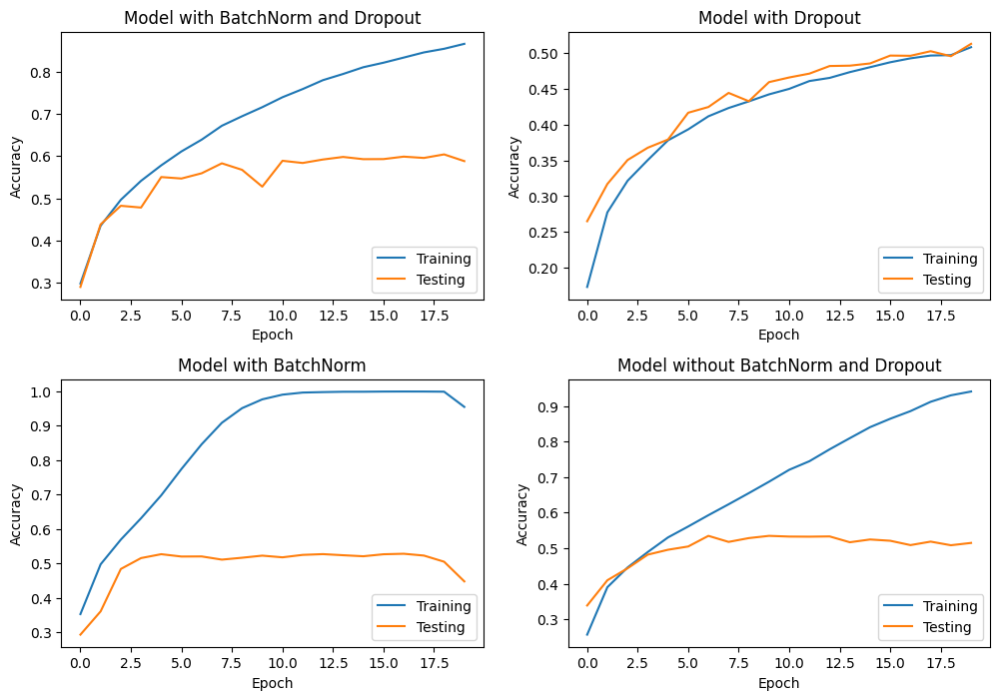

In [ ]:
# ORIGINAL

import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(model_4_history.history['accuracy'], label='Training')
plt.plot(model_4_history.history['val_accuracy'], label='Testing')
plt.title('Model with BatchNorm and Dropout')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
# plt.yticks([0.95, 0.96, 0.97, 0.98, 0.99, 1])

plt.subplot(2, 2, 2)
plt.plot(model_3_history.history['accuracy'], label='Training')
plt.plot(model_3_history.history['val_accuracy'], label='Testing')
plt.title('Model with Dropout')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
# plt.yticks([0.95, 0.96, 0.97, 0.98, 0.99, 1])

plt.subplot(2, 2, 3)
plt.plot(model_2_history.history['accuracy'], label='Training')
plt.plot(model_2_history.history['val_accuracy'], label='Testing')
plt.title('Model with BatchNorm')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
# plt.yticks([0.95, 0.96, 0.97, 0.98, 0.99, 1])

plt.subplot(2, 2, 4)
plt.plot(model_1_history.history['accuracy'], label='Training')
plt.plot(model_1_history.history['val_accuracy'], label='Testing')
plt.title('Model without BatchNorm and Dropout')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
# plt.yticks([0.95, 0.96, 0.97, 0.98, 0.99, 1])

plt.subplots_adjust(hspace=0.3)

plt.show()

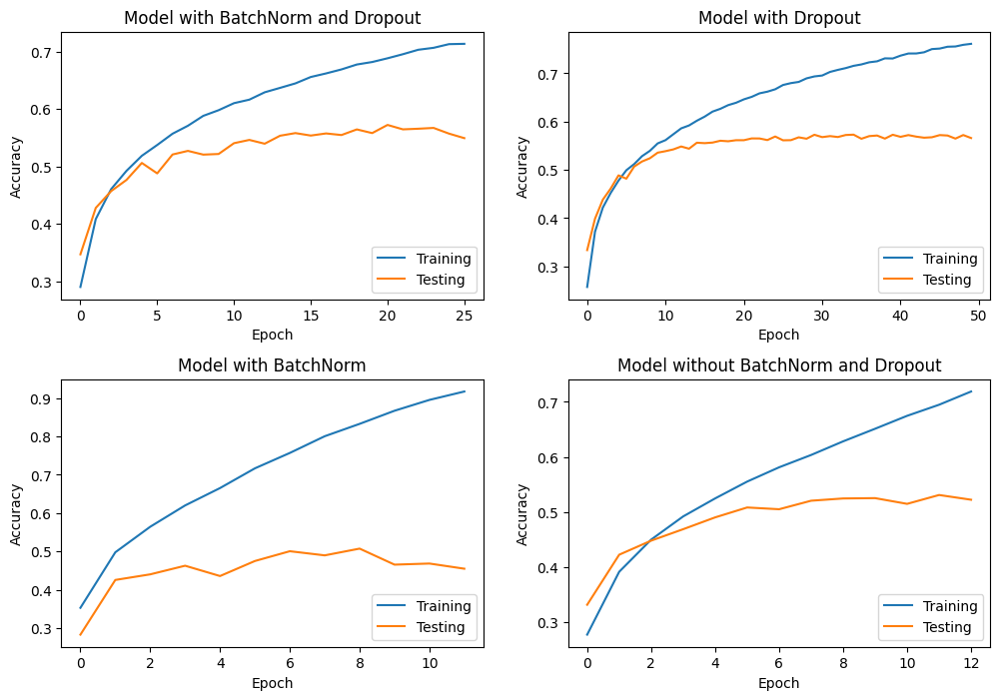

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(model_4_history.history['accuracy'], label='Training')
plt.plot(model_4_history.history['val_accuracy'], label='Testing')
plt.title('Model with BatchNorm and Dropout')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
# plt.yticks([0.95, 0.96, 0.97, 0.98, 0.99, 1])

plt.subplot(2, 2, 2)
plt.plot(model_3_history.history['accuracy'], label='Training')
plt.plot(model_3_history.history['val_accuracy'], label='Testing')
plt.title('Model with Dropout')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
# plt.yticks([0.95, 0.96, 0.97, 0.98, 0.99, 1])

plt.subplot(2, 2, 3)
plt.plot(model_2_history.history['accuracy'], label='Training')
plt.plot(model_2_history.history['val_accuracy'], label='Testing')
plt.title('Model with BatchNorm')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
# plt.yticks([0.95, 0.96, 0.97, 0.98, 0.99, 1])

plt.subplot(2, 2, 4)
plt.plot(model_1_history.history['accuracy'], label='Training')
plt.plot(model_1_history.history['val_accuracy'], label='Testing')
plt.title('Model without BatchNorm and Dropout')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
# plt.yticks([0.95, 0.96, 0.97, 0.98, 0.99, 1])

plt.subplots_adjust(hspace=0.3)

plt.show()

Ваши выводы

Ваш итог

### 1.9. Визуализируйте карты активации модели с BatchNorm() и Dropout(),отдельно по каждому классу(!):

In [ ]:
# Функция из теории (оригинальная)

from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

def visualize_act_map(model, img):
  """
  Функция для визуализации активаций слоев модели Keras в последовательном порядке

  Args:
      model: Обученная модель Keras
      img: Изображение, преобразованное в тензор

  Returns:
      None. Визуализирует активации интересующих слоев в последовательном порядке.
  """
  # Создаем модель для активаций
  layer_outputs = [layer.output for layer in model.layers if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.MaxPooling2D, tf.keras.layers.AveragePooling2D))]
  activation_model = Model(inputs=model.input, outputs=layer_outputs)

  # Получаем активации
  activations = activation_model.predict(img)

  # Визуализация активаций
  for layer_activation, layer in zip(activations, model.layers):
    if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.MaxPooling2D, tf.keras.layers.AveragePooling2D)):
      n_features = layer_activation.shape[-1]
      size = layer_activation.shape[1]
      n_cols = n_features // 16 + int(n_features % 16 > 0)
      display_grid = np.zeros((size * n_cols, size * 16))

      for col in range(n_cols):
        for row in range(16):
            if col * 16 + row < n_features:  # Проверяем, что индекс не выходит за границы
              channel_image = layer_activation[0, :, :, col * 16 + row]
              channel_image -= channel_image.mean()

              # Добавлено исправление для RuntimeWarning: invalid value encountered in divide
              if channel_image.std() == 0:
                channel_image += 1*(10**8)

              channel_image /= channel_image.std()
              channel_image *= 64
              channel_image += 128

              # Добавлено исправление для RuntimeWarning: invalid value encountered in cast
              channel_image = np.clip(channel_image, 0, 255).astype('uint8')

              display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

      scale = 1. / size
      fig, ax = plt.subplots(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
      ax.set_title(layer.name)
      ax.grid(False)
      # Используем imshow для отображения изображений
      ax.imshow(display_grid, aspect='auto', cmap='viridis')

      # Создаем границы между плитками
      for i in range(1, n_cols):
        ax.axhline(y=i * size - 0.5, color='white', linewidth=2)
      for i in range(1, 16):
        ax.axvline(x=i * size - 0.5, color='white', linewidth=2)

      plt.show()

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


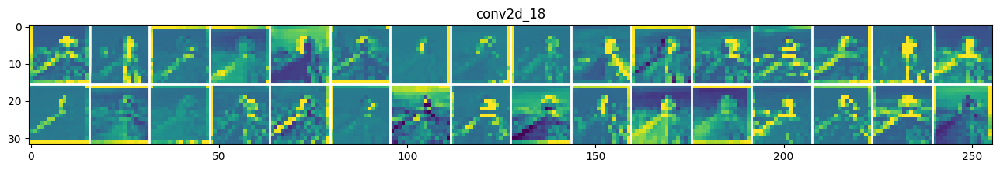

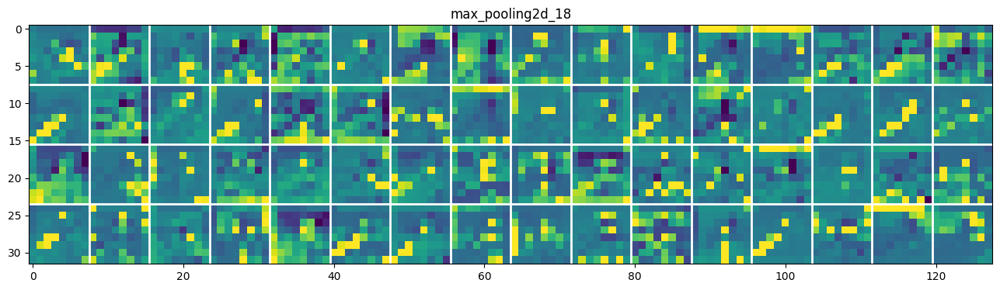

In [ ]:
visualize_act_map(model_4, X_test)

In [ ]:
# Обновлённая функция. Подразумевалось, что она отобразит все слои (2 conv2d, 2 maxpooling)

def visualize_act_map(model, img):
    """
    Функция для визуализации активаций всех свёрточных и объединяющих слоёв модели Keras в последовательном порядке.

    Args:
        model: Обученная модель Keras
        img: Изображение, преобразованное в тензор, с формой (1, 32, 32, 3)

    Returns:
        None. Визуализирует активации интересующих слоев.
    """
    # Собираем выходы всех свёрточных и объединяющих слоёв
    layer_outputs = [
        layer.output
        for layer in model.layers
        if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.MaxPooling2D))
    ]
    activation_model = Model(inputs=model.input, outputs=layer_outputs)

    # Получаем активации
    activations = activation_model.predict(img)

    # Визуализация активаций для каждого слоя
    for layer_activation, layer in zip(activations, activation_model.layers[1:]):  # активируем модель с первого слоя
        n_features = layer_activation.shape[-1]  # Количество фильтров
        size = layer_activation.shape[1]  # Размер активационной карты
        n_cols = n_features // 16 + int(n_features % 16 > 0)  # Число колонок
        display_grid = np.zeros((size * n_cols, size * 16))  # Сетка для отображения

        for col in range(n_cols):
            for row in range(16):
                if col * 16 + row < n_features:  # Проверка индекса
                    channel_image = layer_activation[0, :, :, col * 16 + row]
                    channel_image -= channel_image.mean()

                    # Проверка, чтобы избежать деления на 0
                    if channel_image.std() != 0:
                        channel_image /= channel_image.std()
                    else:
                        channel_image += 1e-10  # Добавляем маленькое значение

                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

        # Визуализация с масштабированием
        scale = 1. / size
        fig, ax = plt.subplots(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
        ax.set_title(layer.name)
        ax.grid(False)
        ax.imshow(display_grid, aspect='auto', cmap='viridis')

        # Границы между плитками
        for i in range(1, n_cols):
            ax.axhline(y=i * size - 0.5, color='white', linewidth=2)
        for i in range(1, 16):
            ax.axvline(x=i * size - 0.5, color='white', linewidth=2)

        plt.show()

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


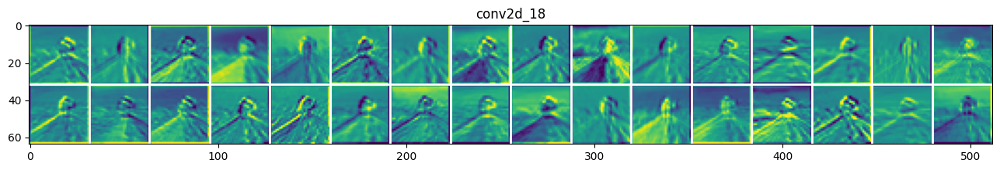

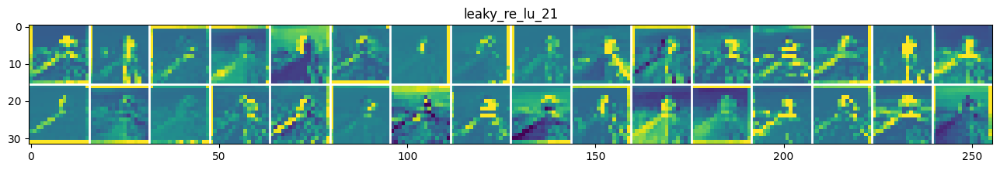

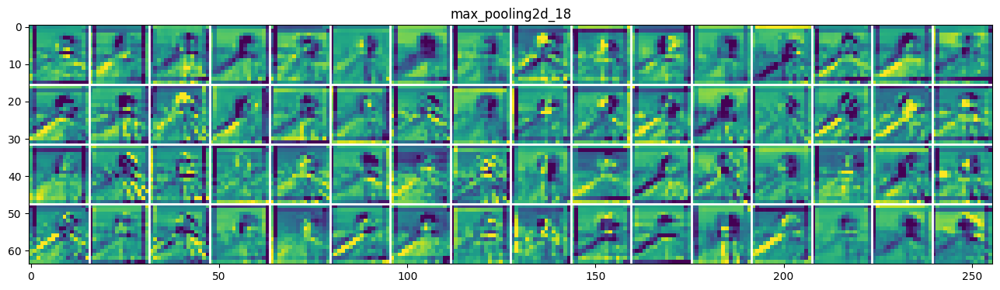

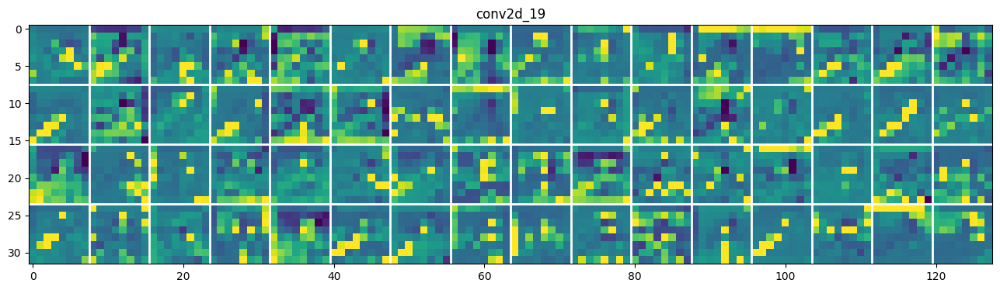

In [ ]:
visualize_act_map(model_4, X_test)

In [ ]:
# Версия 2-ой функции для всех классов

def visualize_act_map_by_class(model, X_test, y_test, class_names, n_classes=20):
    """
    Функция для визуализации карт активаций для каждого класса CIFAR-100.

    Args:
        model: Обученная модель Keras
        X_test: Массив тестовых изображений CIFAR-100
        y_test: Массив меток для тестовых изображений CIFAR-100
        class_names: Список имён классов CIFAR-100
        n_classes: Количество классов для визуализации

    Returns:
        None. Визуализирует активации интересующих слоев для каждого класса.
    """
    # Собираем только слои Conv2D и MaxPooling2D
    layer_outputs = [
        layer.output
        for layer in model.layers
        if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.MaxPooling2D))
    ]
    activation_model = Model(inputs=model.input, outputs=layer_outputs)

    # Получаем изображения для каждого класса
    for class_idx in range(n_classes):
        # Выбираем все изображения для данного класса
        class_images = X_test[y_test == class_idx]

        # Если есть хотя бы одно изображение для этого класса
        if len(class_images) > 0:
            # Берём первое изображение данного класса для активаций
            img = np.expand_dims(class_images[0], axis=0)  # Сначала добавляем размерность для батча
            activations = activation_model.predict(img)

            # Визуализируем карты активации для каждого слоя
            for layer_activation, layer in zip(activations, activation_model.layers[1:]):  # пропускаем первый слой
                n_features = layer_activation.shape[-1]
                size = layer_activation.shape[1]
                n_cols = n_features // 16 + int(n_features % 16 > 0)
                display_grid = np.zeros((size * n_cols, size * 16))

                for col in range(n_cols):
                    for row in range(16):
                        if col * 16 + row < n_features:
                            channel_image = layer_activation[0, :, :, col * 16 + row]
                            channel_image -= channel_image.mean()

                            # Проверка, чтобы избежать деления на 0
                            if channel_image.std() != 0:
                                channel_image /= channel_image.std()
                            else:
                                channel_image += 1e-10  # Добавляем маленькое значение

                            channel_image *= 64
                            channel_image += 128
                            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

                # Визуализация
                scale = 1. / size
                fig, ax = plt.subplots(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
                ax.set_title(f'{class_names[class_idx]} - {layer.name}')
                ax.grid(False)
                ax.imshow(display_grid, aspect='auto', cmap='viridis')

                # Границы между плитками
                for i in range(1, n_cols):
                    ax.axhline(y=i * size - 0.5, color='white', linewidth=2)
                for i in range(1, 16):
                    ax.axvline(x=i * size - 0.5, color='white', linewidth=2)

                plt.show()

In [ ]:
y_test = y_test.flatten()
X_train = X_train / 255.0
X_test = X_test / 255.0

In [ ]:
y_test

array([10, 10,  0, ...,  4,  8,  2])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


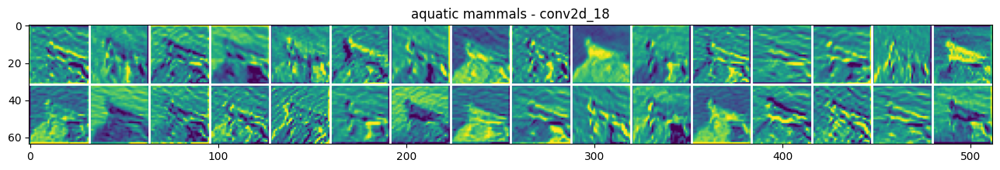

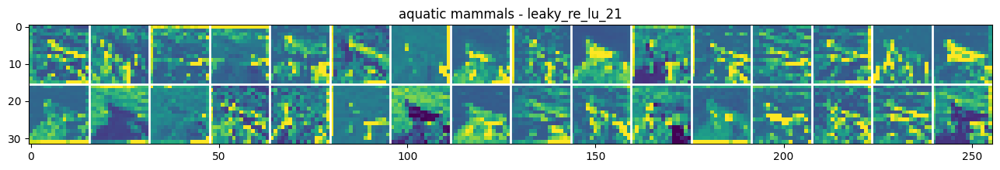

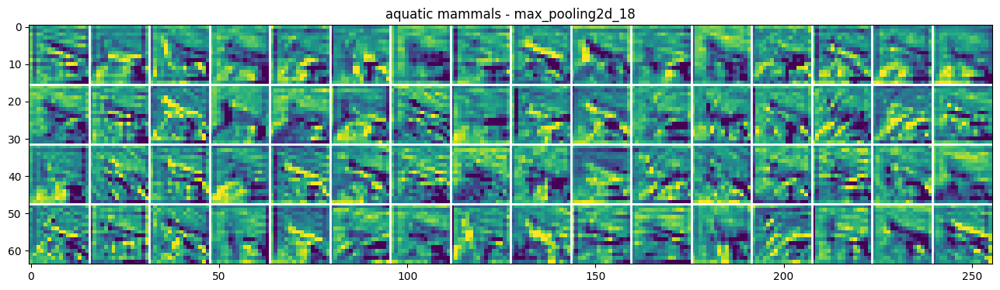

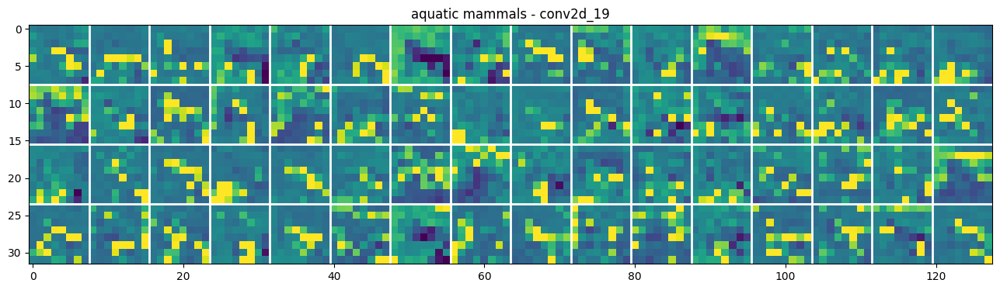

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


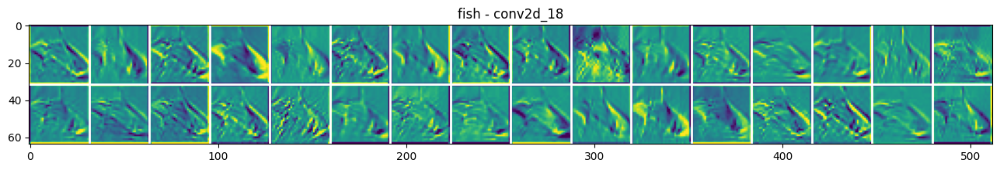

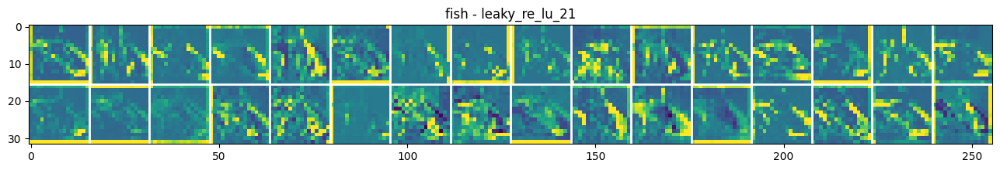

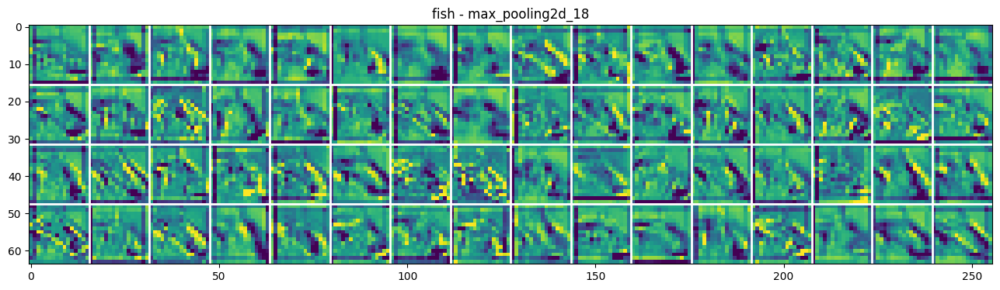

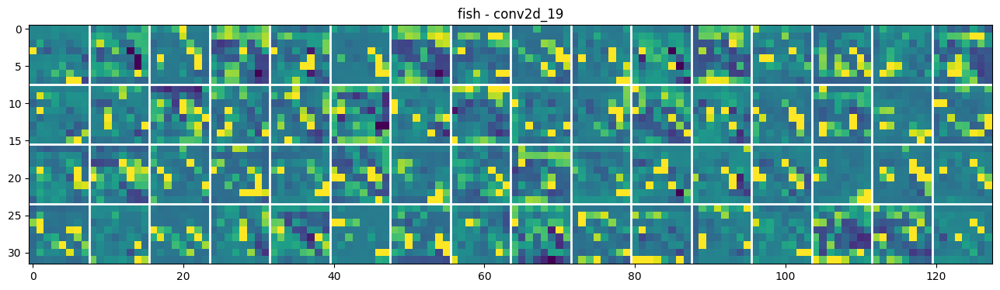

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


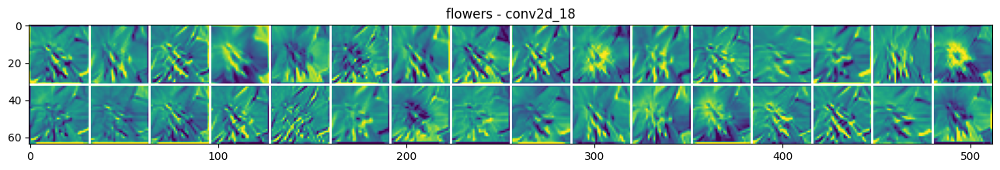

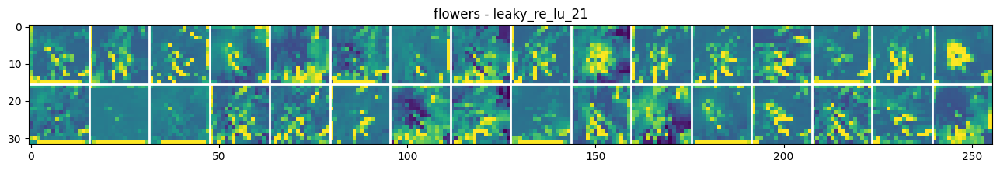

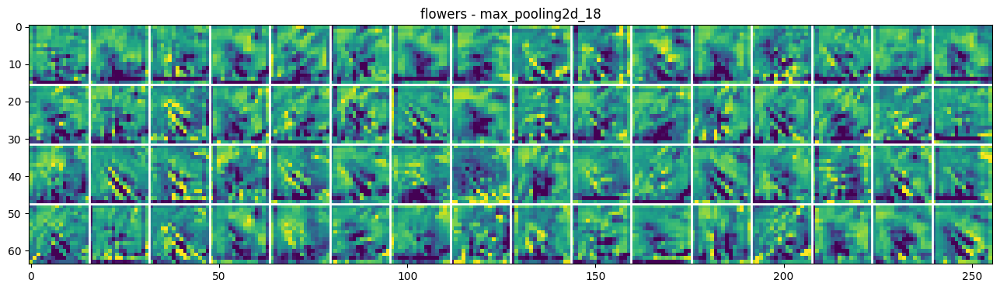

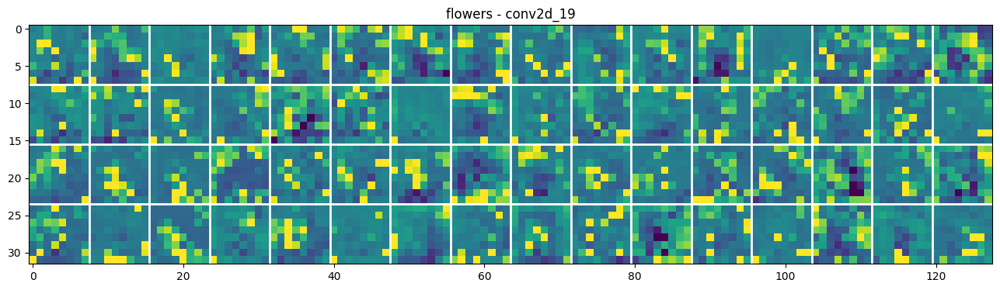

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


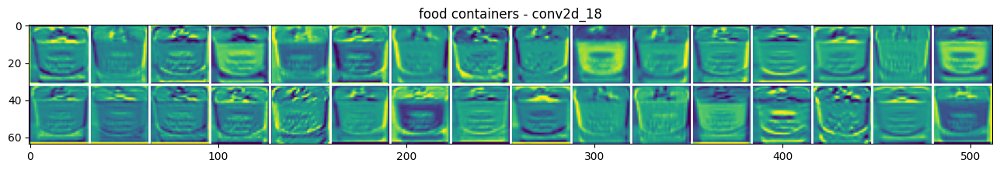

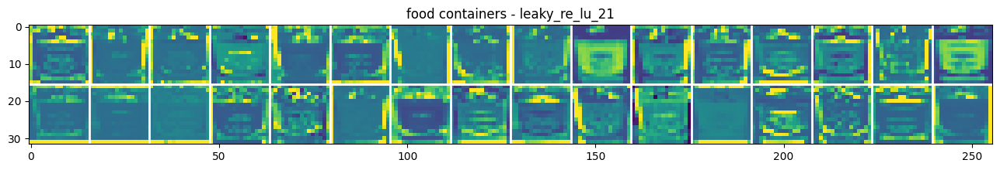

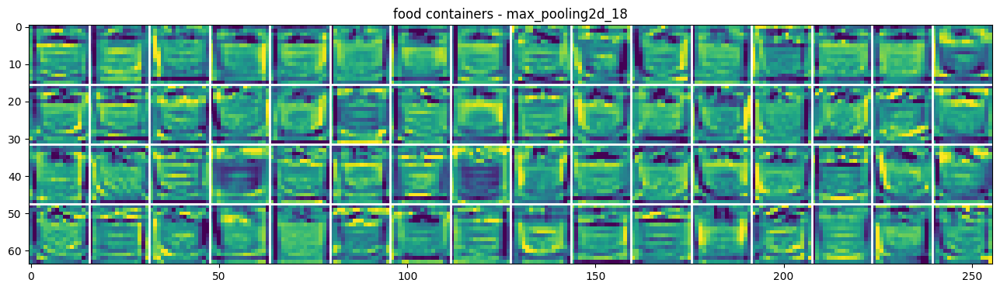

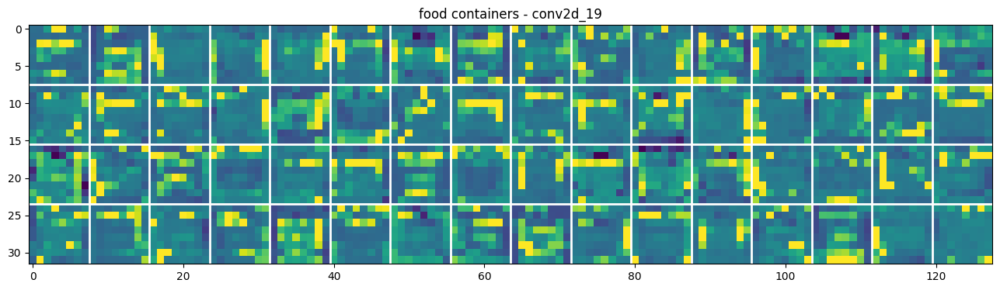

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


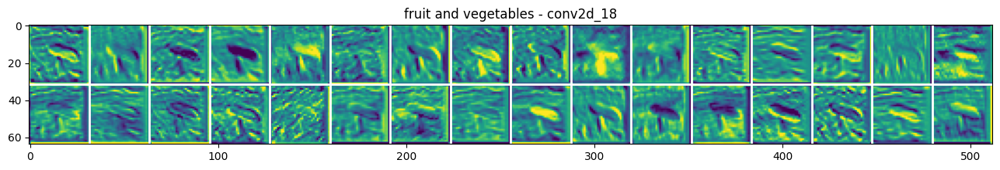

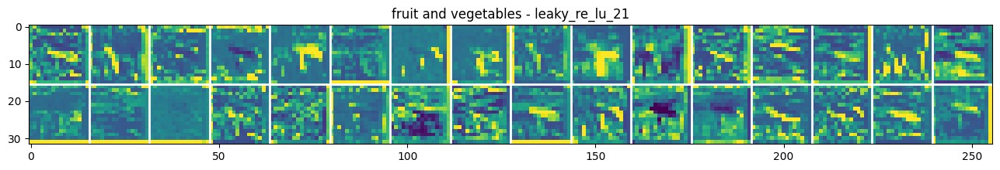

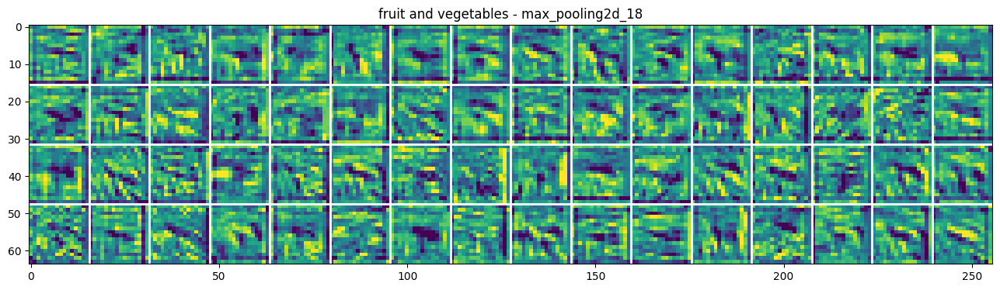

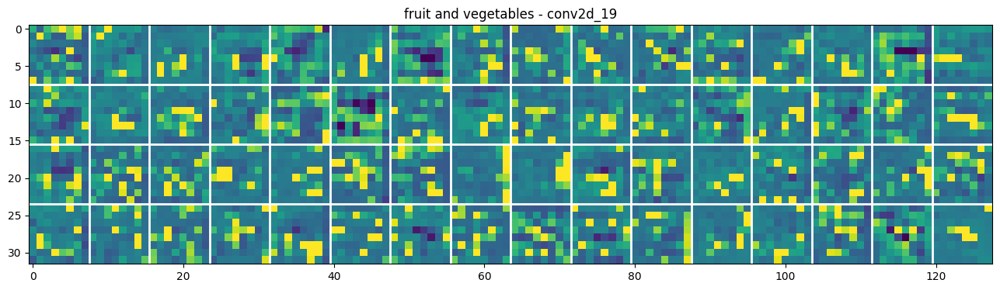

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


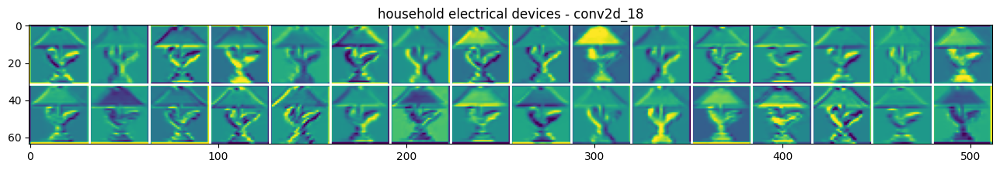

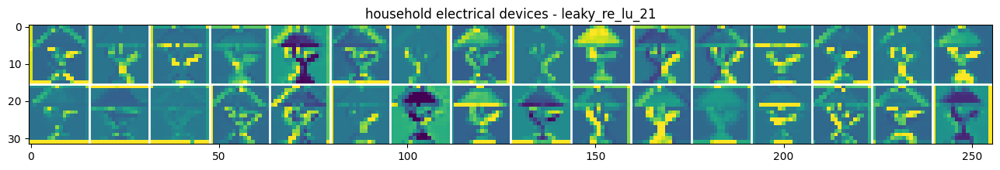

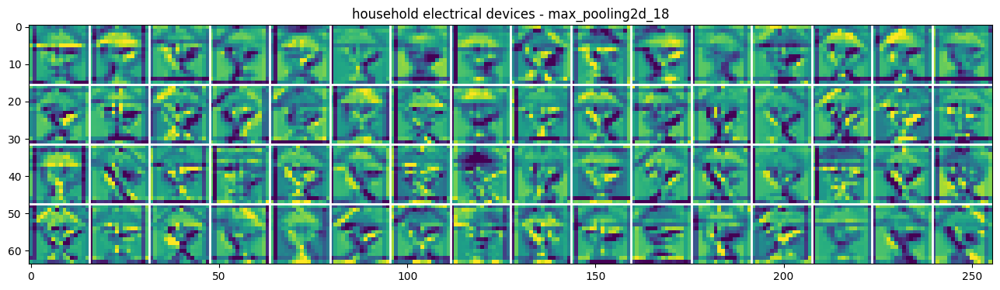

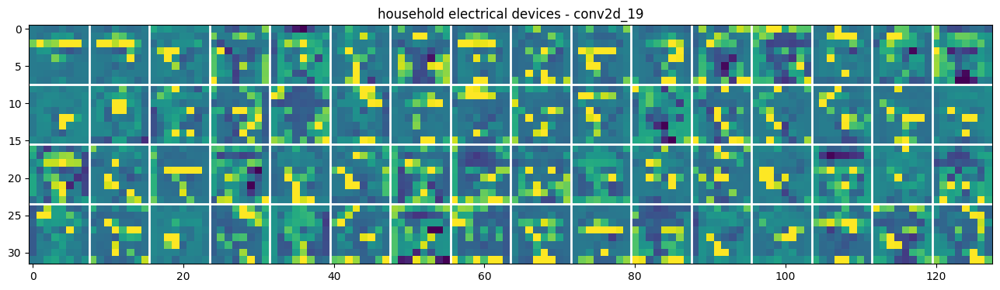

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


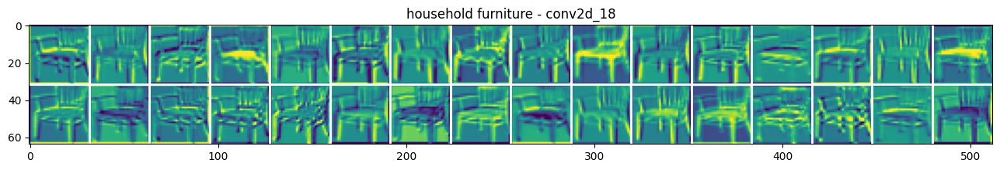

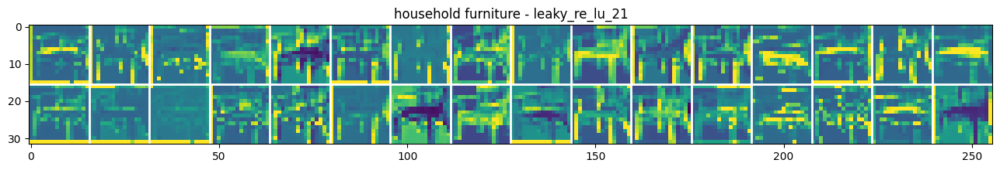

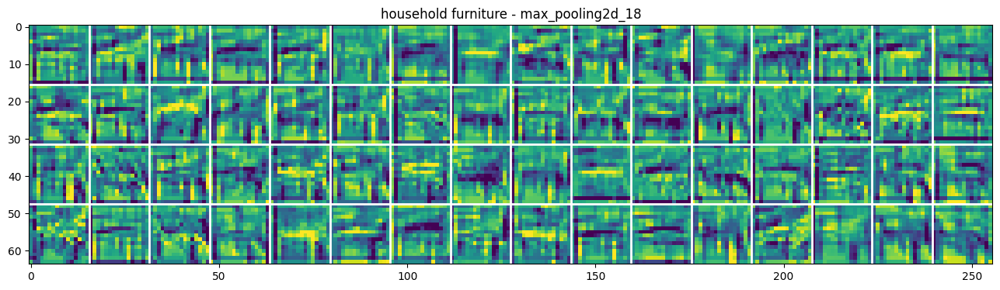

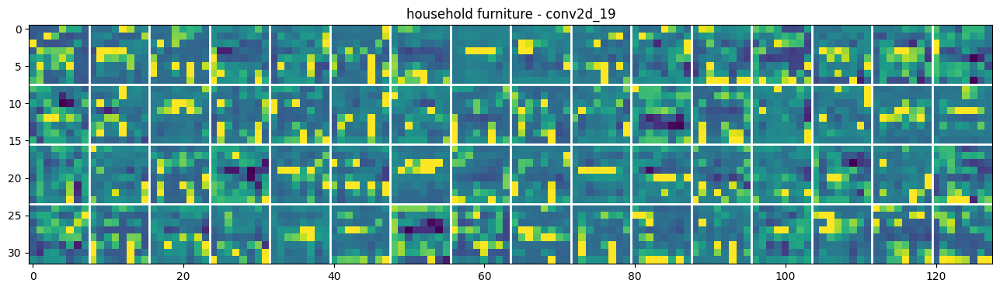

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


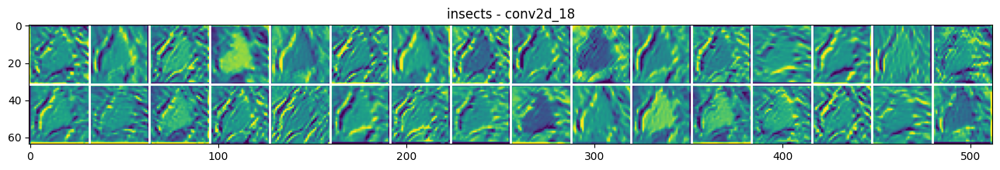

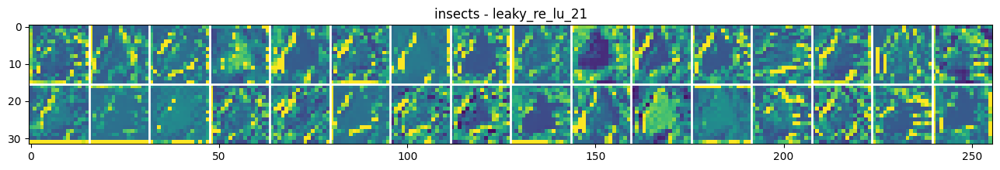

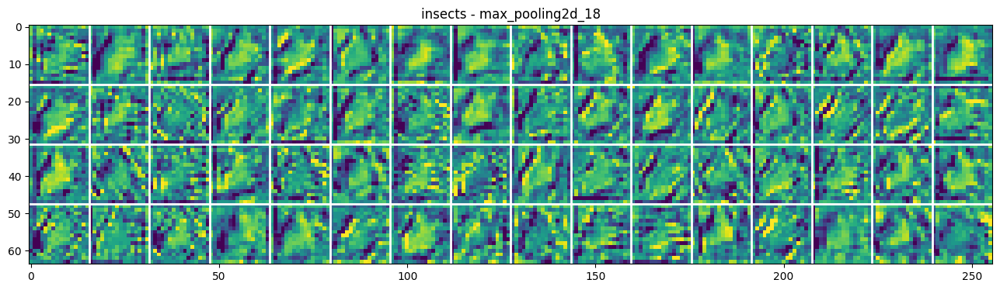

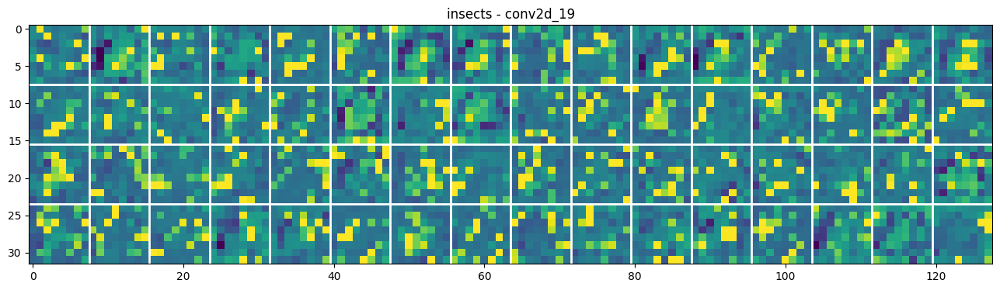

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


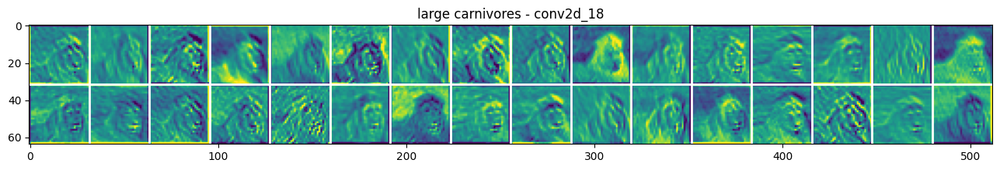

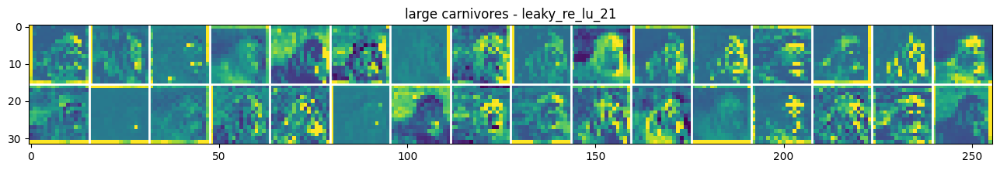

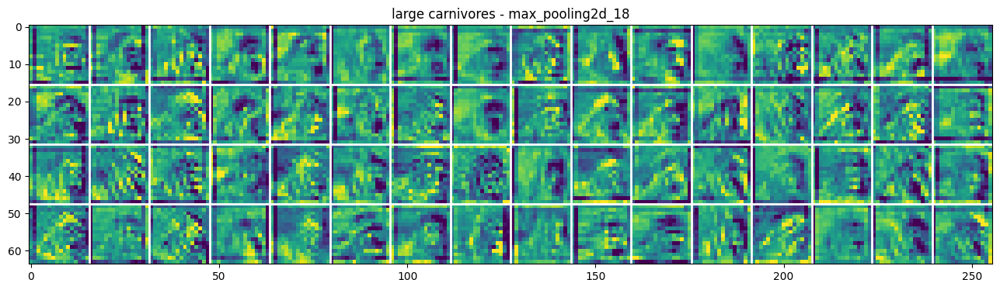

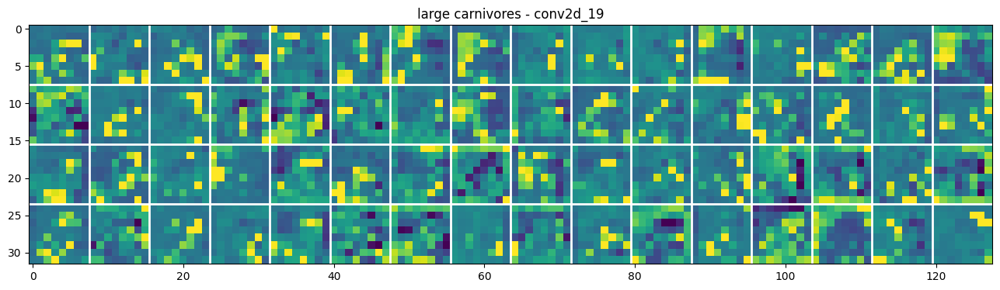

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


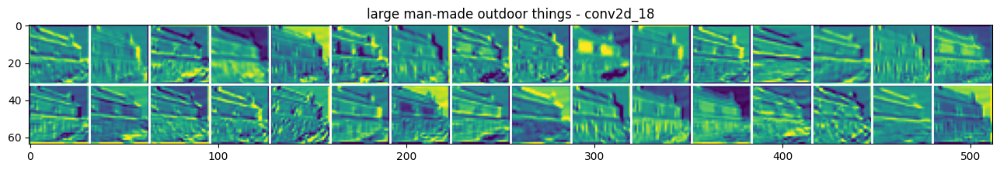

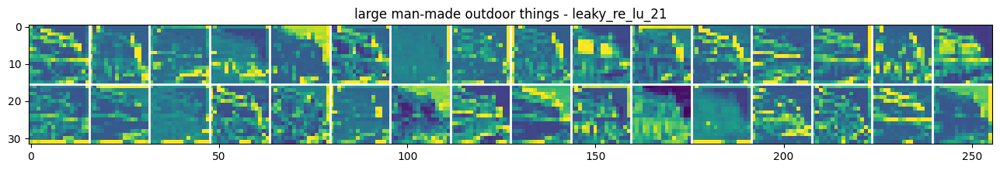

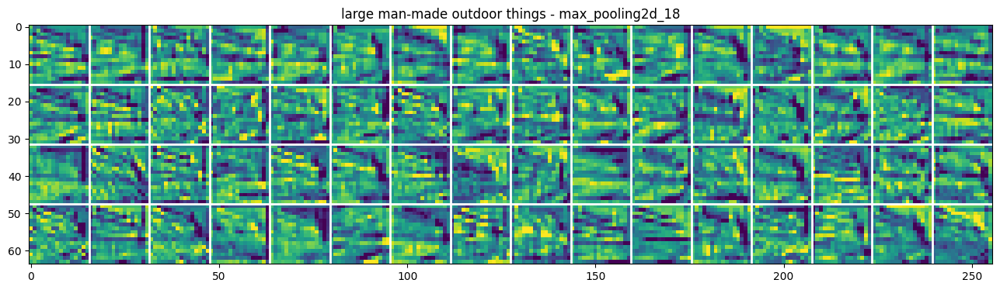

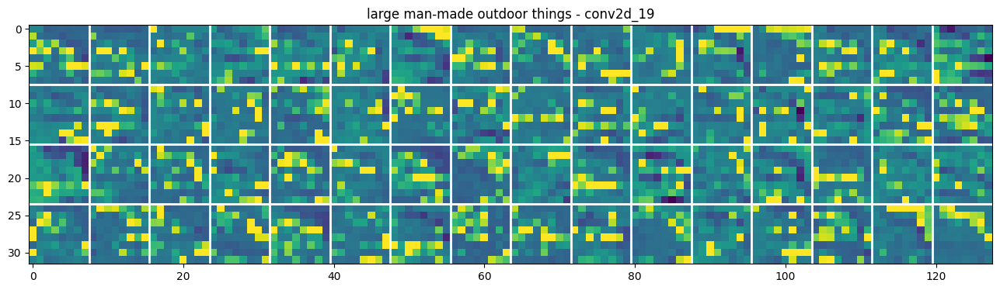

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


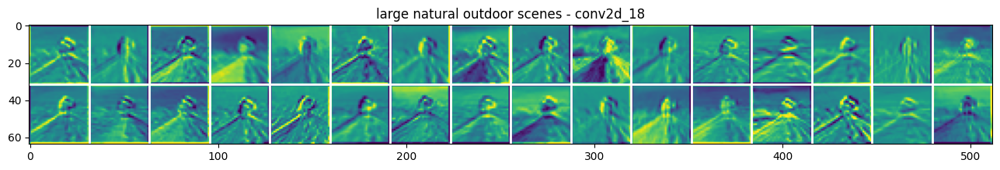

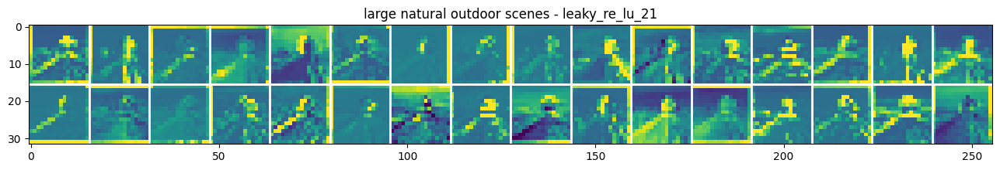

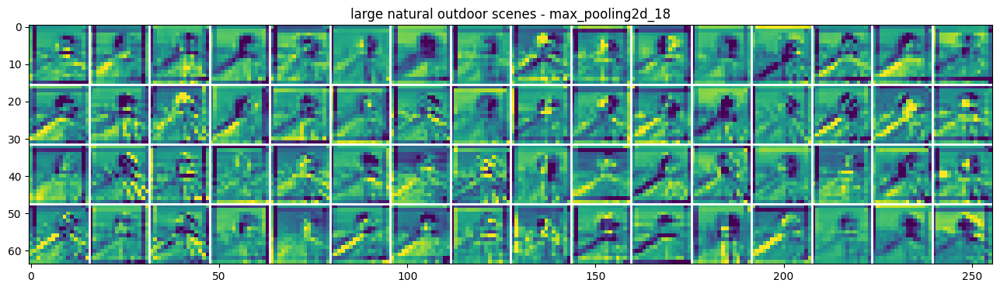

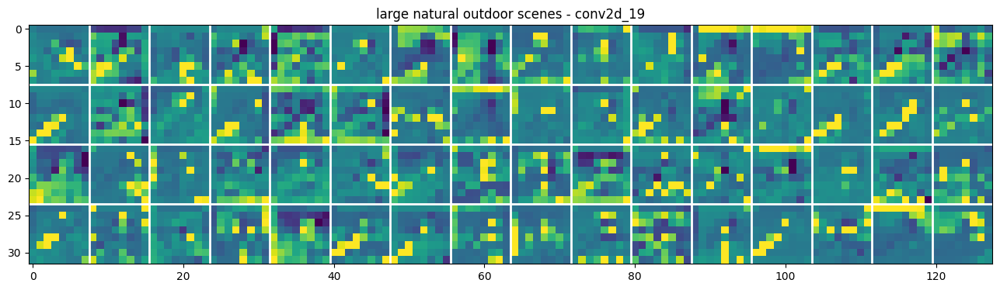

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


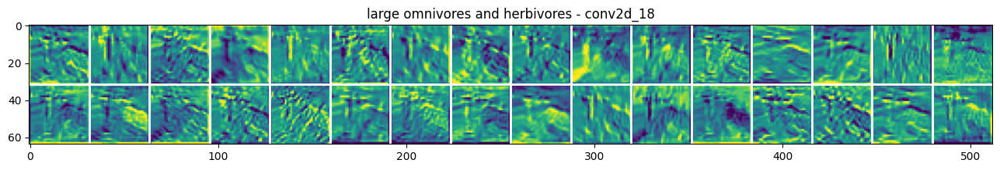

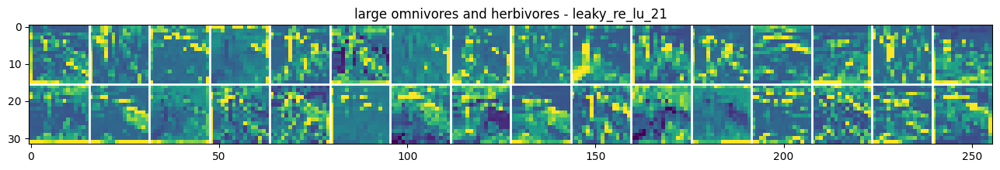

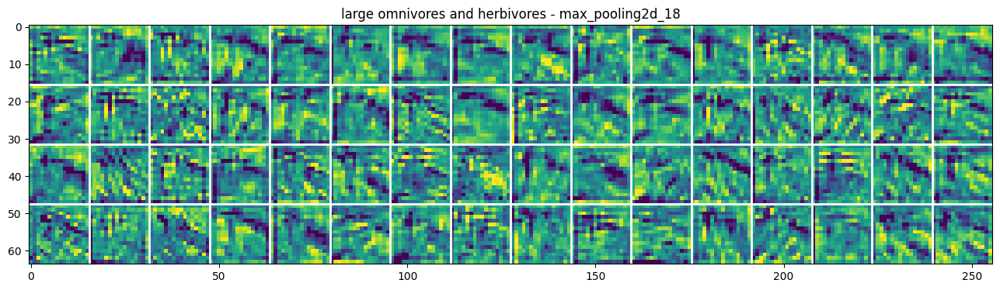

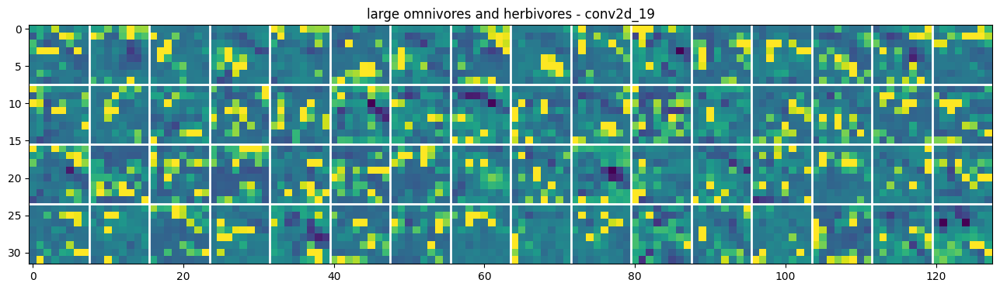

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


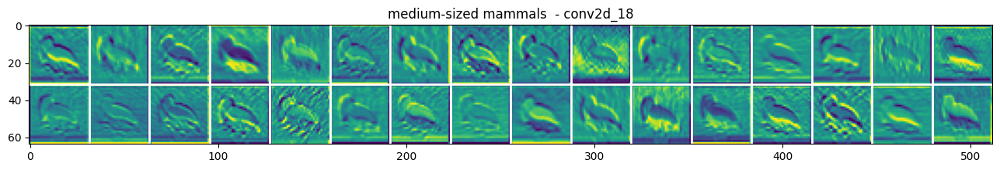

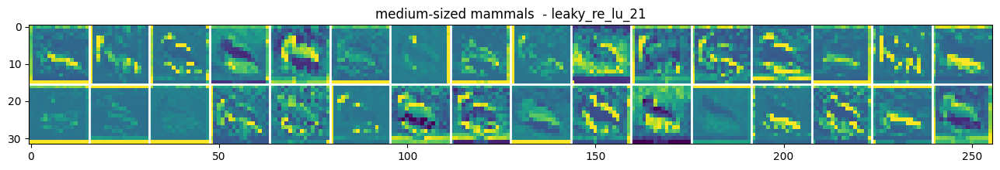

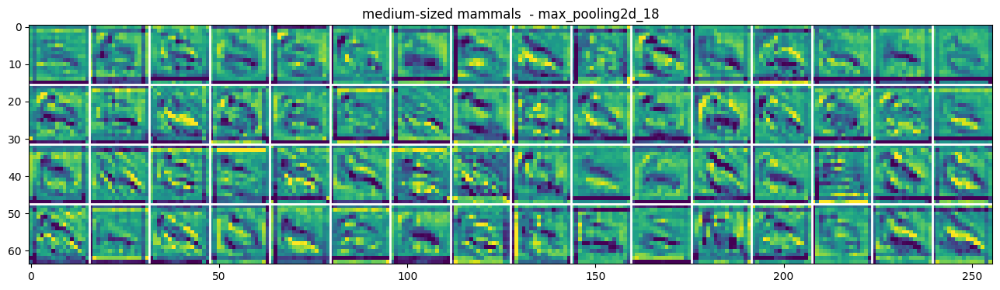

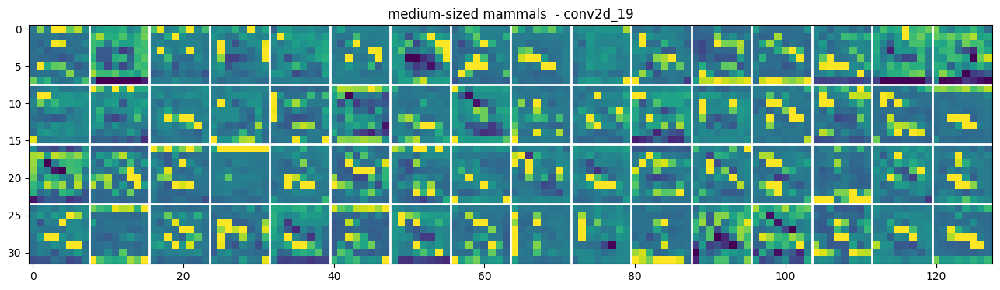

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


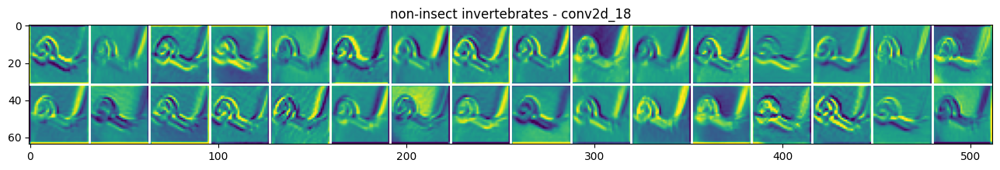

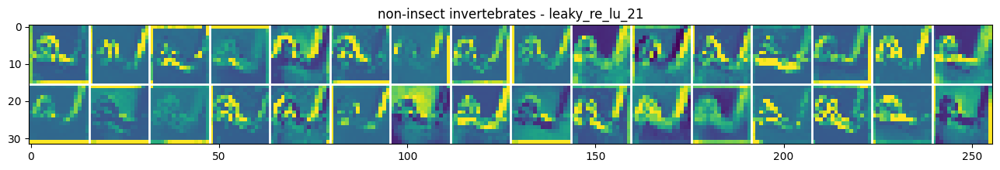

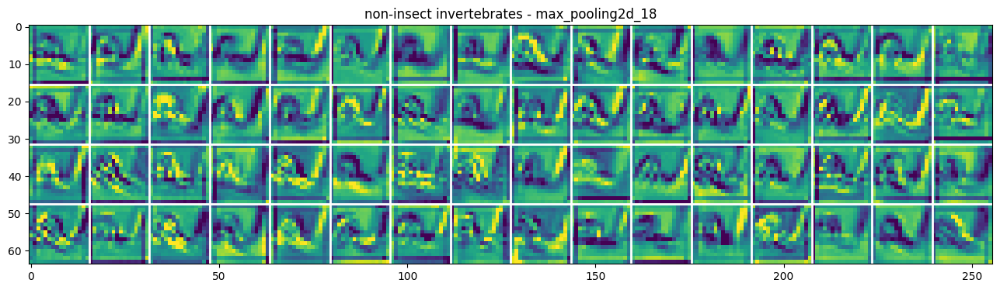

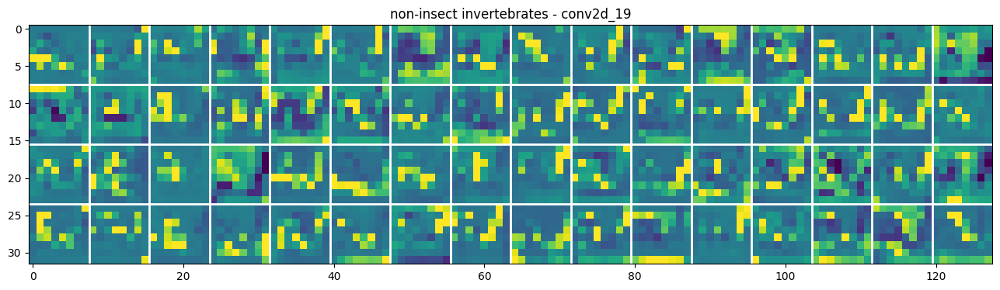

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


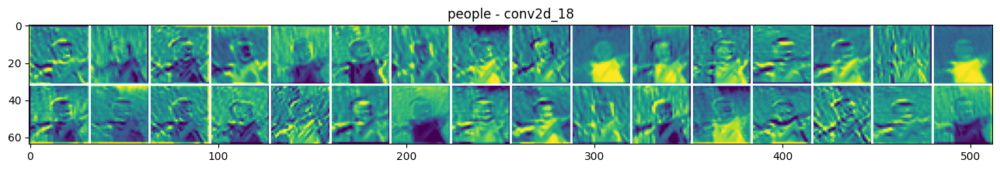

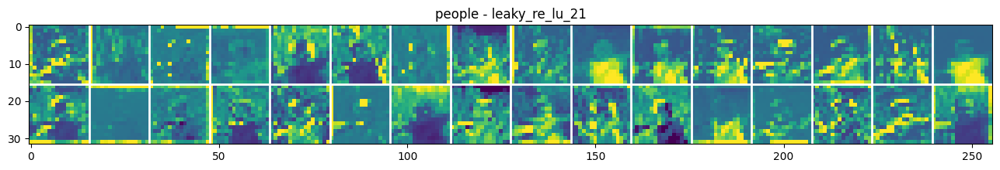

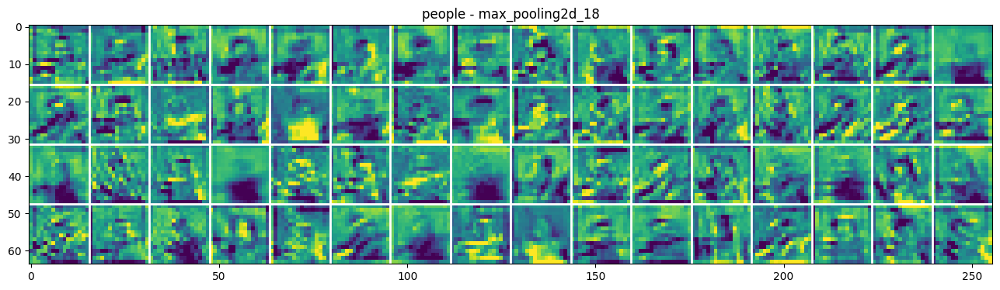

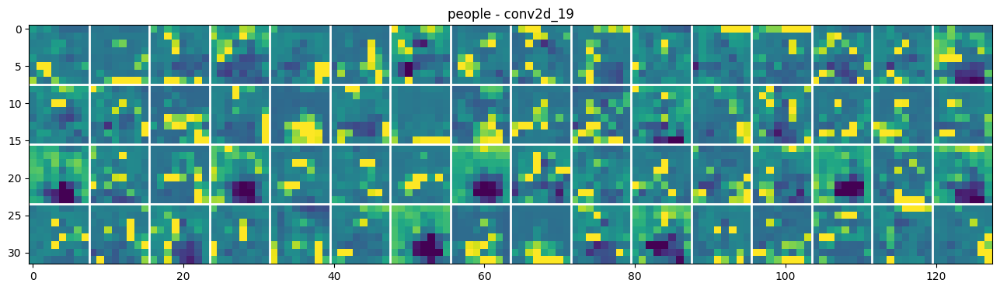

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


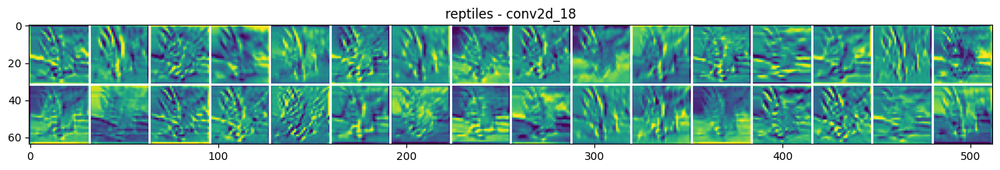

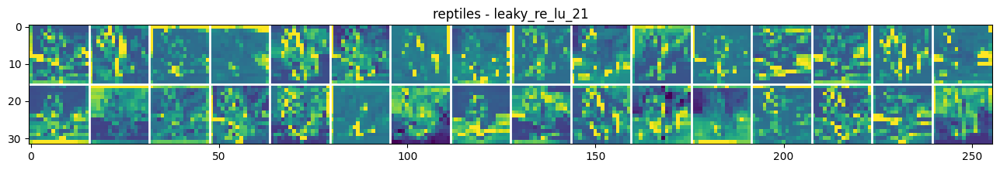

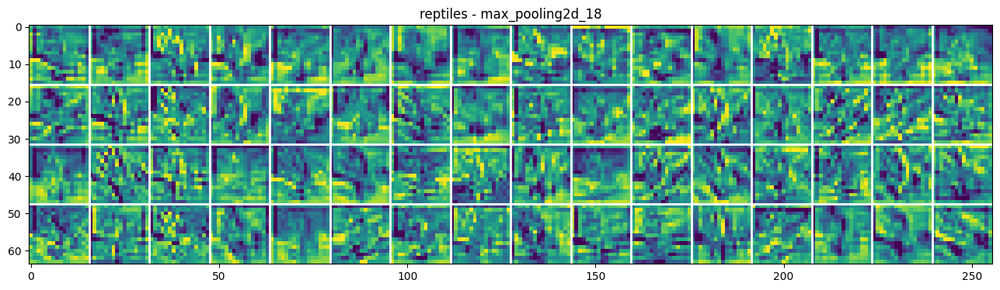

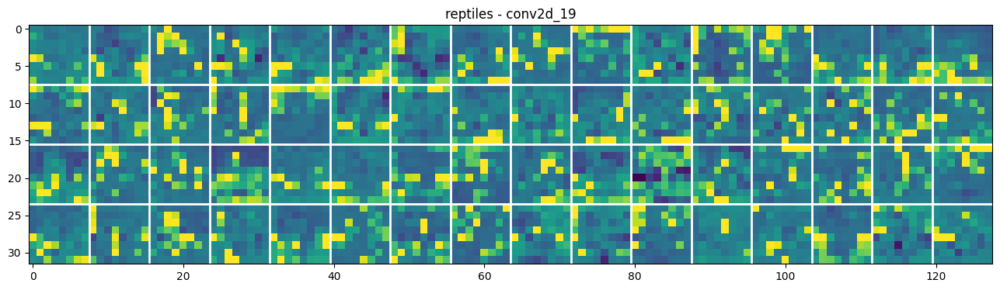

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


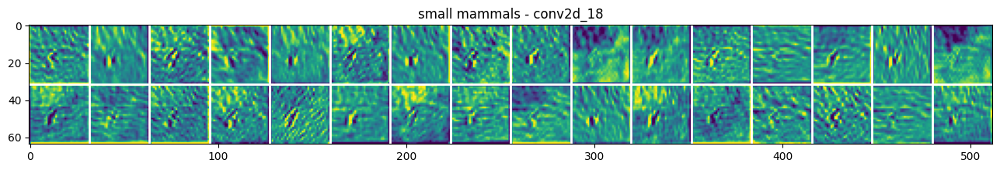

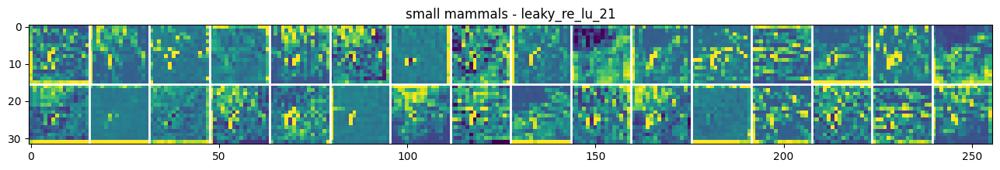

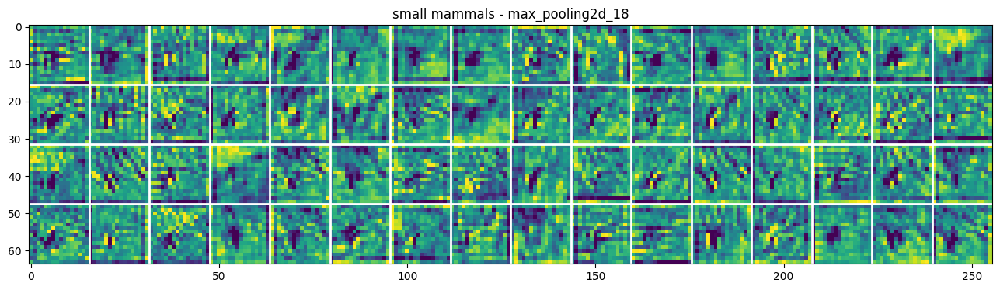

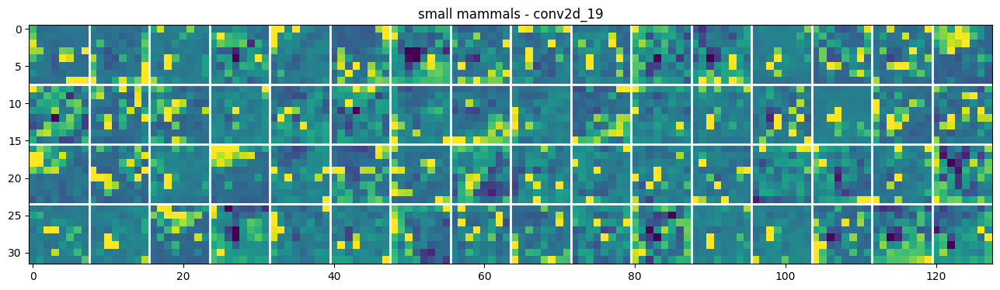

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


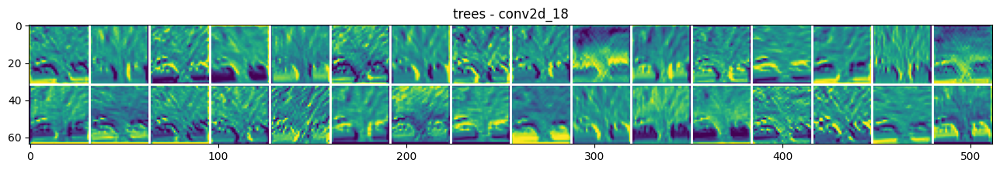

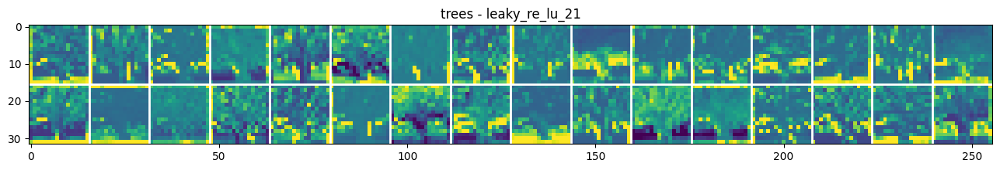

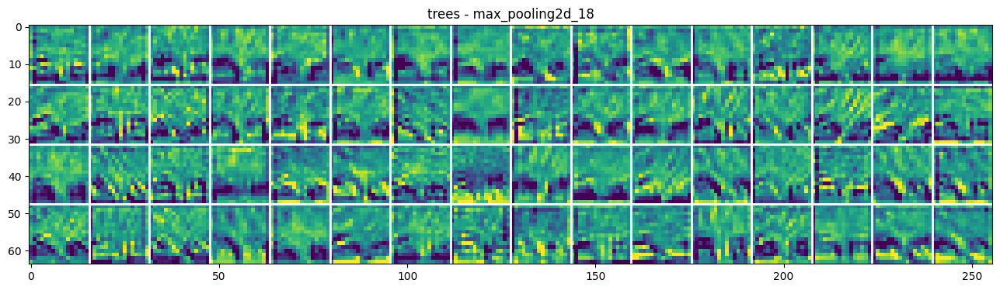

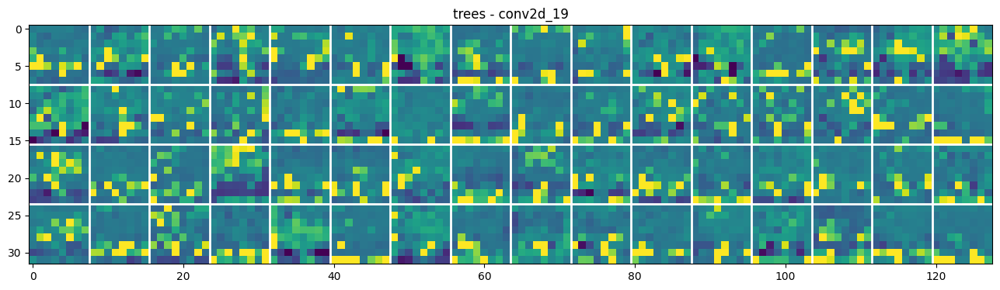

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


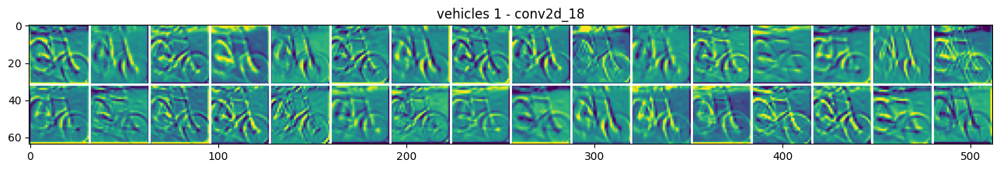

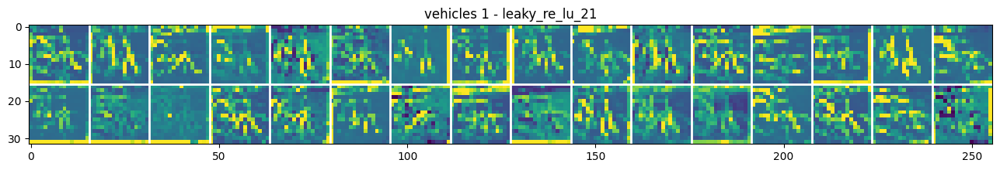

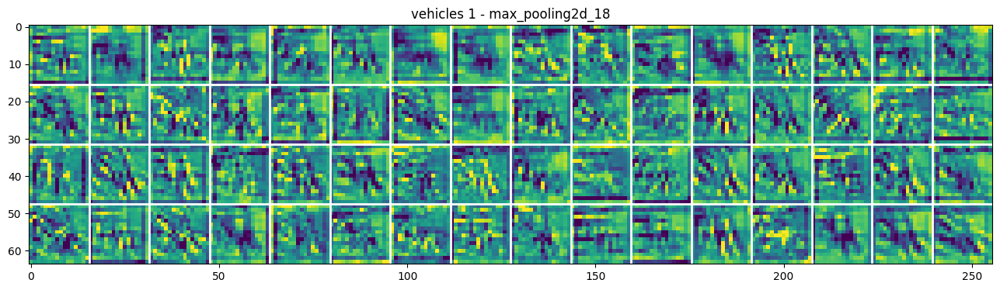

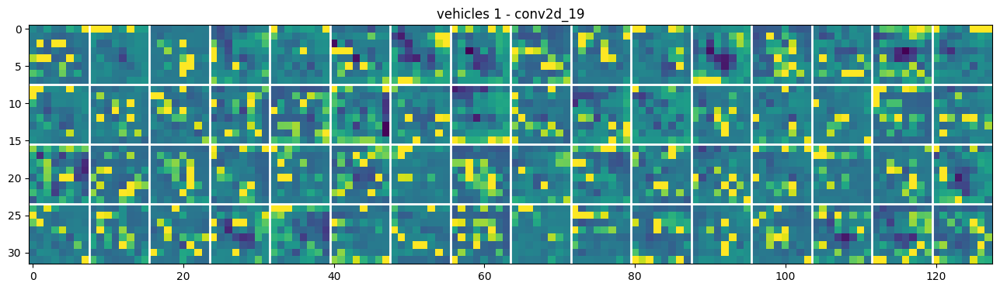

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


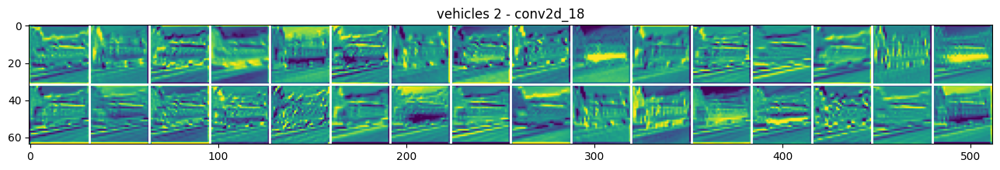

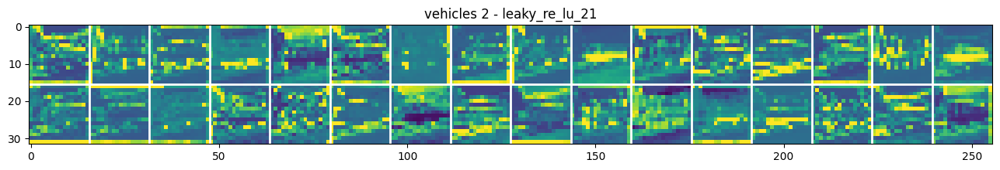

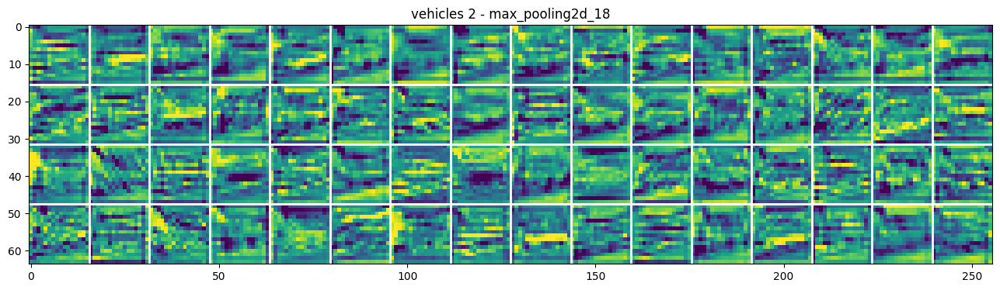

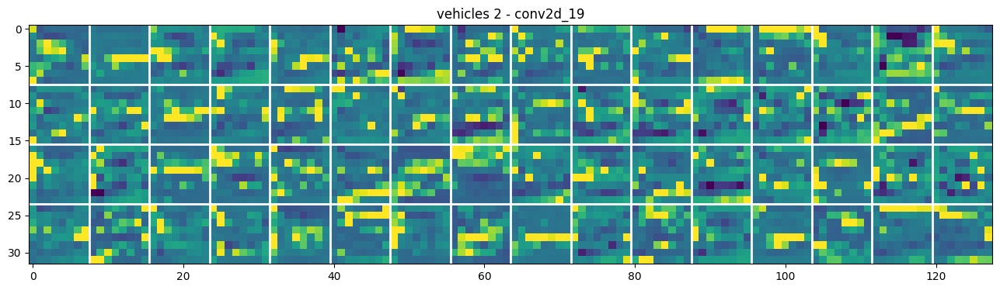

In [ ]:
class_names = ['aquatic mammals',
              'fish',
              'flowers',
              'food containers',
              'fruit and vegetables',
              'household electrical devices',
              'household furniture',
              'insects',
              'large carnivores',
              'large man-made outdoor things',
              'large natural outdoor scenes',
              'large omnivores and herbivores',
              'medium-sized mammals ',
              'non-insect invertebrates',
              'people',
              'reptiles',
              'small mammals',
              'trees',
              'vehicles 1',
              'vehicles 2']

visualize_act_map_by_class(model_4, X_test, y_test, class_names, n_classes=20)

## Задание 2. Загрузите Ваш датасет из предыдущей работы. Разделите его на обучающую и тестовую выборки. Обучите модель классификации с применением BatchNorm() и Dropout(). Сравните точность с моделями, обученными Вами ранее. Визуализируйте карты активаций.

In [ ]:
! pip install wldhx.yadisk-direct
! curl -L $(yadisk-direct https://disk.yandex.ru/d/dvzVYw5ztexmFQ) -o arch.zip
! unzip -qq arch.zip

In [ ]:
from imutils import paths
import random
import cv2
import os
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split

data = []
labels = []

imagePaths = sorted(list(paths.list_images("/content/Vegetable Images/train")))
random.shuffle(imagePaths)

# формируем выборку
for imagePath in imagePaths:

	image = cv2.imread(imagePath)
	image = cv2.resize(image, (32, 32))

	data.append(image)

	label = imagePath.split(os.path.sep)[-2]
	labels.append(label)

data = np.array(data, dtype="float")
labels = np.array(labels)

(X_train, X_test, y_train, y_test) = train_test_split(data,
	labels, test_size=0.25, random_state=42)

X_train = X_train / 255
X_test = X_test / 255

lb = LabelBinarizer()
y_train = lb.fit_transform(y_train)
y_test = lb.transform(y_test)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2250, 32, 32, 3), (750, 32, 32, 3), (2250, 3), (750, 3))

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, Activation, ReLU, Input
from keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Model

# Создаём входной слой
inputs = Input(shape=(32, 32, 3))

# Добавляем остальные слои
x = Conv2D(32, (3,3), padding='same')(inputs)
x = ReLU()(x)
x = MaxPooling2D((2, 2), strides=2)(x)
# x = Dropout(0.1)(x)
x = Flatten()(x)
x = Dropout(0.2)(x)
x = Dense(12)(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = Dense(3)(x)
# x = BatchNormalization()(x)
outputs = Activation("softmax")(x)

# Определяем модель
model = Model(inputs=inputs, outputs=outputs)

model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

early_stopping = EarlyStopping(patience=5)

checkpoint = ModelCheckpoint(filepath="best_model_4_5.keras",
                             monitor="val_accuracy",
                             save_best_only=True,
                             verbose=0)

In [ ]:
model_history = model.fit(X_train, y_train,
                              validation_data=(X_test, y_test),
                              batch_size=200,
                              epochs=15,
                              verbose=1,
                              callbacks=[early_stopping, checkpoint])

Epoch 1/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - accuracy: 0.7154 - loss: 0.6937 - val_accuracy: 0.3587 - val_loss: 0.9384
Epoch 2/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.9324 - loss: 0.3015 - val_accuracy: 0.6987 - val_loss: 0.7595
Epoch 3/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.9585 - loss: 0.2330 - val_accuracy: 0.9227 - val_loss: 0.7071
Epoch 4/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9658 - loss: 0.2031 - val_accuracy: 0.9573 - val_loss: 0.6266
Epoch 5/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9877 - loss: 0.1597 - val_accuracy: 0.9440 - val_loss: 0.5101
Epoch 6/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9956 - loss: 0.1397 - val_accuracy: 0.9493 - val_loss: 0.4126
Epoch 7/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9949 - loss: 0.1119 - val_accuracy: 0.8853 - val_loss: 0.4002
Epoch 8/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9970 - loss: 0.0902 - val_accuracy: 0.9267 - val_

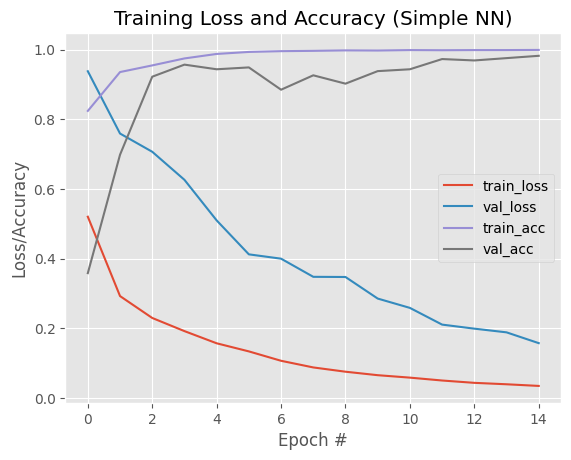

In [ ]:
# строим графики потерь и точности
EPOCHS = 15

N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure()
plt.plot(N, model_history.history["loss"], label="train_loss")
plt.plot(N, model_history.history["val_loss"], label="val_loss")
plt.plot(N, model_history.history["accuracy"], label="train_acc")
plt.plot(N, model_history.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy (Simple NN)")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.savefig('plot.png')

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

def show_metrics(model):
  pred = model.predict(X_test)
  Y_pred = pred.argmax(axis=1)
  Y_val = y_test.argmax(axis=1)
  print('Отчёт классификации:', classification_report(Y_val, Y_pred),
        sep = '\n\n', end = '\n\n')

  conf_mat = confusion_matrix(Y_val, Y_pred)
  sns.heatmap(conf_mat, annot=True, fmt="d", cmap="YlGnBu")
  plt.show()

In [ ]:
from google.colab import drive
from keras.models import load_model

# drive.mount('/content/drive/MyDrive/')

model_3_1 = load_model('/content/drive/MyDrive/best_model_3_1.keras')
model_3_2 = load_model('/content/drive/MyDrive/best_model_3_2.keras')

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Отчёт классификации:

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       233
           1       0.96      1.00      0.98       261
           2       1.00      0.95      0.97       256

    accuracy                           0.98       750
   macro avg       0.98      0.98      0.98       750
weighted avg       0.98      0.98      0.98       750




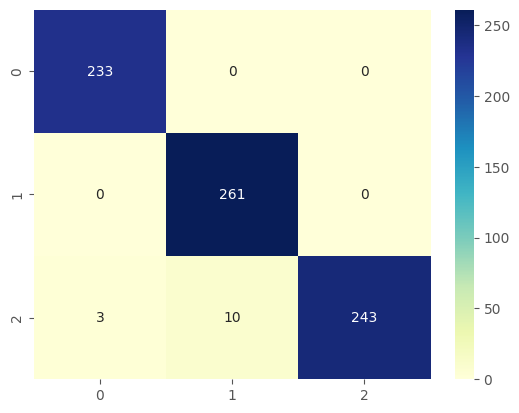

In [ ]:
show_metrics(model)

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
Отчёт классификации:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       233
           1       0.98      0.98      0.98       261
           2       0.98      0.97      0.97       256

    accuracy                           0.98       750
   macro avg       0.98      0.98      0.98       750
weighted avg       0.98      0.98      0.98       750




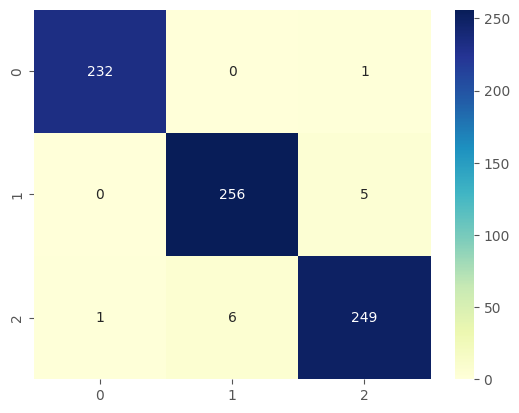

In [ ]:
show_metrics(model_3_1)

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
Отчёт классификации:

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       233
           1       0.99      0.98      0.99       261
           2       0.98      0.98      0.98       256

    accuracy                           0.99       750
   macro avg       0.99      0.99      0.99       750
weighted avg       0.99      0.99      0.99       750




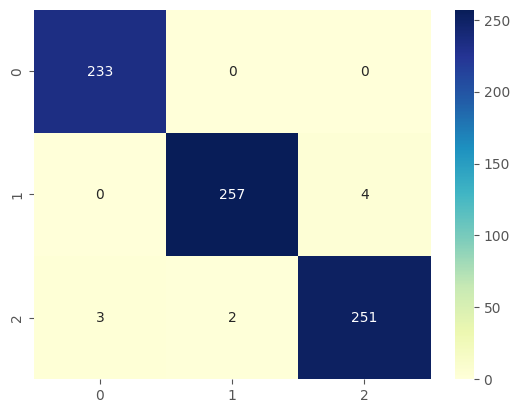

In [ ]:
show_metrics(model_3_2)

In [ ]:
def visualize_act_map_by_class(model, X_test, y_test, class_names, n_classes=3):
    """
    Функция для визуализации карт активаций для каждого класса CIFAR-100.

    Args:
        model: Обученная модель Keras
        X_test: Массив тестовых изображений CIFAR-100
        y_test: Массив меток для тестовых изображений CIFAR-100
        class_names: Список имён классов CIFAR-100
        n_classes: Количество классов для визуализации

    Returns:
        None. Визуализирует активации интересующих слоев для каждого класса.
    """
    # Собираем только слои Conv2D и MaxPooling2D
    layer_outputs = [
        layer.output
        for layer in model.layers
        if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.MaxPooling2D))
    ]
    activation_model = Model(inputs=model.input, outputs=layer_outputs)

    # Получаем изображения для каждого класса
    for class_idx in range(n_classes):
        # Выбираем все изображения для данного класса
        class_images = X_test[y_test.argmax(axis=1) == class_idx]

        # Если есть хотя бы одно изображение для этого класса
        if len(class_images) > 0:
            # Берём первое изображение данного класса для активаций
            img = np.expand_dims(class_images[0], axis=0)  # Сначала добавляем размерность для батча
            activations = activation_model.predict(img)

            # Визуализируем карты активации для каждого слоя
            for layer_activation, layer in zip(activations, activation_model.layers[1:]):  # пропускаем первый слой
                n_features = layer_activation.shape[-1]
                size = layer_activation.shape[1]
                n_cols = n_features // 16 + int(n_features % 16 > 0)
                display_grid = np.zeros((size * n_cols, size * 16))

                for col in range(n_cols):
                    for row in range(16):
                        if col * 16 + row < n_features:
                            channel_image = layer_activation[0, :, :, col * 16 + row]
                            channel_image -= channel_image.mean()

                            # Проверка, чтобы избежать деления на 0
                            if channel_image.std() != 0:
                                channel_image /= channel_image.std()
                            else:
                                channel_image += 1e-10  # Добавляем маленькое значение

                            channel_image *= 64
                            channel_image += 128
                            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

                # Визуализация
                scale = 1. / size
                fig, ax = plt.subplots(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
                ax.set_title(f'{class_names[class_idx]} - {layer.name}')
                ax.grid(False)
                ax.imshow(display_grid, aspect='auto', cmap='viridis')

                # Границы между плитками
                for i in range(1, n_cols):
                    ax.axhline(y=i * size - 0.5, color='white', linewidth=2)
                for i in range(1, 16):
                    ax.axvline(x=i * size - 0.5, color='white', linewidth=2)

                plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


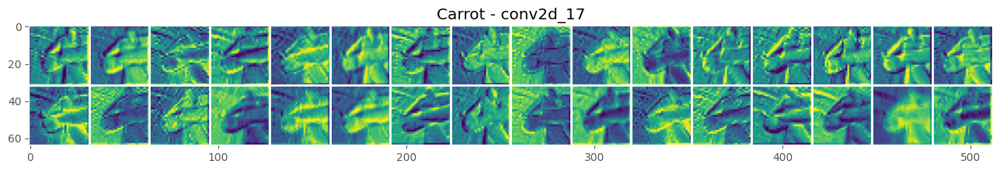

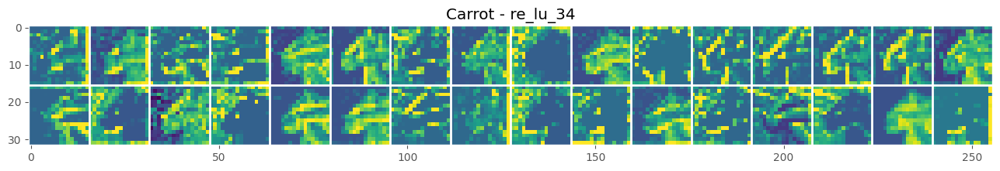

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


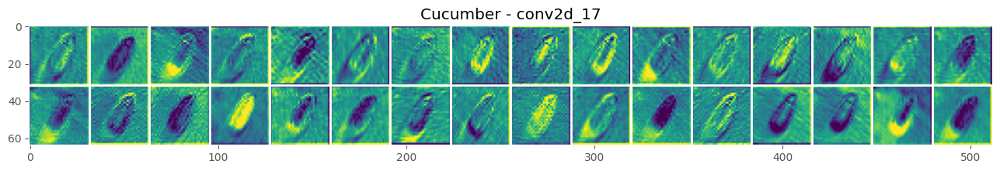

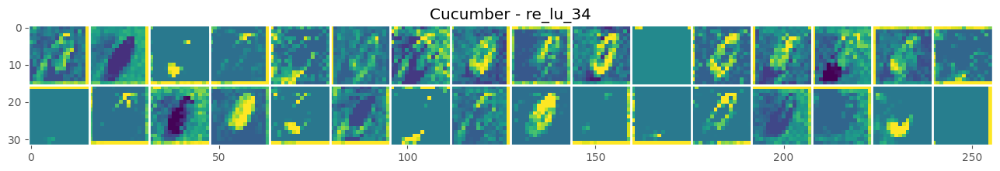

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


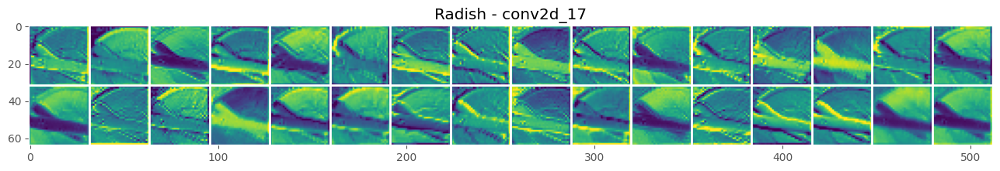

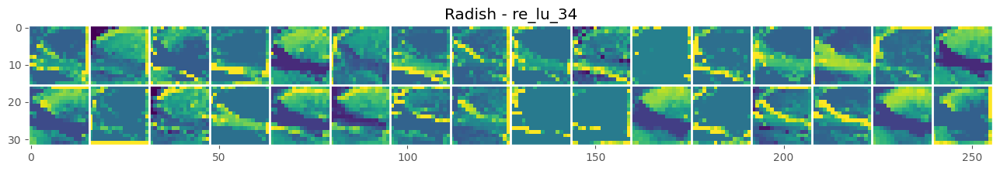

In [ ]:
class_names = ['Carrot', 'Cucumber', 'Radish']

visualize_act_map_by_class(model, X_test, y_test, class_names, n_classes=3)